# Project desription

This is an educational project.

We are the Marketing Analyst for the entertainment app Procrastinate Pro+. Despite huge investments in advertising, the company has been losing money for the past few months. Our task is to understand the reasons and help the company to become profitable.


The company provided data on users attracted from May 1 to October 27, 2019:

- server log with data about their visits,
- data upload on their purchases for this period,
- advertising expenses.

To be explored:

- Where do users come from and what devices do they use (acquisition channels and platforms)?
- How much does it cost to attract users from various advertising channels (CAC by channel)?
- How much money does each client bring (LTV by clients and in dynamics by weeks/months)?
- When does the cost of customer acquisition pay off (ROI)?
- What factors hinder customer acquisition (CR, retention and analytics)?

In [2]:
# load all libs for project

import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt

plt.style.use('dark_background') # make plots stylish

#visits_link = https://drive.google.com/file/d/1M_mWf0NUeZc9WmxDZQuCemXdtfoMghQH/view?usp=sharing


#orders_link = https://drive.google.com/file/d/1McZFsrouLxj7gEVZ3wxHQx664vwLn6b1/view?usp=sharing


#costs_link = https://drive.google.com/file/d/1MffOKWyhI8304lfOjlMYNu-tIo0bHB7l/view?usp=sharing

## Data preparation

In [1]:
# load files
try:
    visits = pd.read_csv('G:/My Drive/VS code/YPracticum prj/Marketing_analysis_mobile_app/visits_info_short.csv')
    
except:
    print("Could not load data from file 'orders_info_short.csv'")
try:
    orders = pd.read_csv('G:/My Drive/VS code/YPracticum prj/Marketing_analysis_mobile_app/orders_info_short.csv')
except:
    print("Could not load data from file 'orders_info_short.csv'")

try:
    costs = pd.read_csv('G:/My Drive/VS code/YPracticum prj/Marketing_analysis_mobile_app/costs_info_short.csv')
except:
    print("Could not load data from file 'costs_info_short.csv'")


Could not load data from file 'orders_info_short.csv'
Could not load data from file 'orders_info_short.csv'
Could not load data from file 'costs_info_short.csv'


In [3]:
display(visits.head(10))
visits.info()

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40
5,90242400005,United States,iPhone,RocketSuperAds,2019-05-01 07:14:52,2019-05-01 08:19:56
6,43958116050,United States,Android,organic,2019-05-01 09:03:21,2019-05-01 10:08:39
7,185365244969,United States,iPhone,organic,2019-05-01 09:37:03,2019-05-01 10:00:43
8,446013509831,United States,iPhone,RocketSuperAds,2019-05-01 10:26:00,2019-05-01 10:59:17
9,100970711362,United States,Mac,TipTop,2019-05-01 04:39:53,2019-05-01 04:57:05


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [4]:
visits.duplicated().sum() # check for explicit duplicates

0

In [5]:
print(visits['Region'].unique()) # check for implicit duplicates
print(visits['Device'].unique())
print(visits['Channel'].unique())
c = len(visits['User Id'].unique()) # check for unique users
print(f'Unique users count:{c}') 

['United States' 'UK' 'France' 'Germany']
['iPhone' 'Mac' 'Android' 'PC']
['organic' 'TipTop' 'RocketSuperAds' 'YRabbit' 'FaceBoom' 'MediaTornado'
 'AdNonSense' 'LeapBob' 'WahooNetBanner' 'OppleCreativeMedia'
 'lambdaMediaAds']
Unique users count:150008


In [6]:
visits.rename(columns={'User Id':'user_id', 'Session Start':'session_start', 'Session End':'session_end'}, inplace=True)
visits.columns = visits.columns.str.lower() # make columns names lower case
visits['session_start'] = pd.to_datetime(visits['session_start']) # make date columns in date format
visits['session_end'] = pd.to_datetime(visits['session_end'])
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   user_id        309901 non-null  int64         
 1   region         309901 non-null  object        
 2   device         309901 non-null  object        
 3   channel        309901 non-null  object        
 4   session_start  309901 non-null  datetime64[ns]
 5   session_end    309901 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(3)
memory usage: 14.2+ MB


#### Visits table review

The table of visits has 6 columns with 309901 entries. No passes found. No obvious duplicates found. No implicit duplicates were found in the columns region, device, channel. Columns with the start and end times of the sessions in the line record format must be converted to the datetime type. Column names must match the snake_case style. The number of unique users is approximately two times less than the number of rows in the dataset.


In [7]:
display(orders.head(10))
orders.info()

,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99
5,129100331057,2019-05-01 01:56:28,4.99
6,626807144131,2019-05-01 02:39:21,4.99
7,914062168985,2019-05-01 02:02:18,4.99
8,769669137453,2019-05-01 03:39:47,4.99
9,434198630691,2019-05-01 18:16:50,5.99


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [8]:
orders.duplicated().sum() # check for explicit duplicates

0

In [9]:
c = len(orders['User Id'].unique()) # check for unique users
print(f'Unique users count:{c}')

Unique users count:8881


In [10]:
orders.columns = orders.columns.str.lower() # make columns names lower case
orders.rename(columns={'user id':'user_id', 'event dt':'event_dt'}, inplace=True)
orders['event_dt'] = pd.to_datetime(orders['event_dt']) # make date columns in date format
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   user_id   40212 non-null  int64         
 1   event_dt  40212 non-null  datetime64[ns]
 2   revenue   40212 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 942.6 KB


#### Orders table review

The table has 3 columns with 40212 entries. No gaps were found in the records. No explicit or implicit duplicates found. Column names must be in snake_case. The data format of the event dt column must be converted to datetime.


In [11]:
display(costs.head(10))
costs.info()

,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1
5,2019-05-06,FaceBoom,118.8
6,2019-05-07,FaceBoom,101.2
7,2019-05-08,FaceBoom,100.1
8,2019-05-09,FaceBoom,93.5
9,2019-05-10,FaceBoom,104.5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


In [12]:
costs.duplicated().sum() # check for explicit duplicates

0

In [13]:
costs['Channel'].unique() # check for implicit duplicates

array(['FaceBoom', 'MediaTornado', 'RocketSuperAds', 'TipTop', 'YRabbit',
       'AdNonSense', 'LeapBob', 'OppleCreativeMedia', 'WahooNetBanner',
       'lambdaMediaAds'], dtype=object)

In [14]:
costs.columns=costs.columns.str.lower() # make columns names lower case
costs['dt'] = pd.to_datetime(costs['dt']).dt.date # make date columns in date format
costs.info()
costs

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


,dt,channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1
...,...,...,...
1795,2019-10-23,lambdaMediaAds,4.0
1796,2019-10-24,lambdaMediaAds,6.4
1797,2019-10-25,lambdaMediaAds,8.8
1798,2019-10-26,lambdaMediaAds,8.8


#### Costs table review

The table has 3 columns with 1800 entries. No gaps or duplicates found. No implicit duplicates were found in the channel column. The column names need to be converted to snake_case and the data type in the dt column needs to be changed.



array([[<AxesSubplot:title={'center':'costs'}>]], dtype=object)

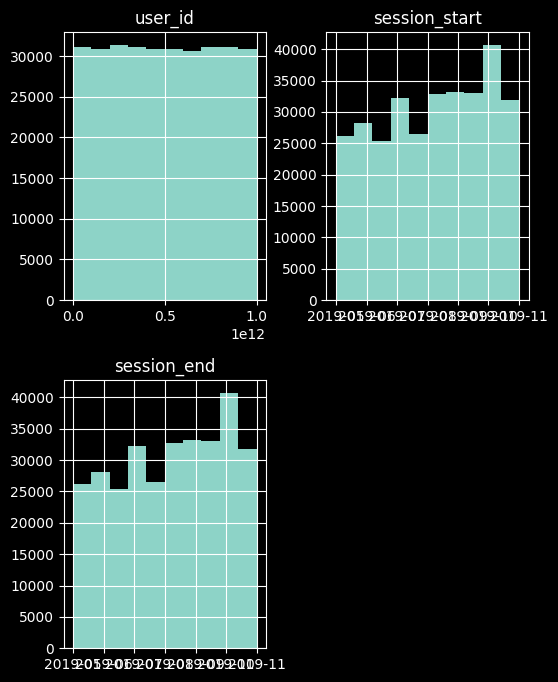

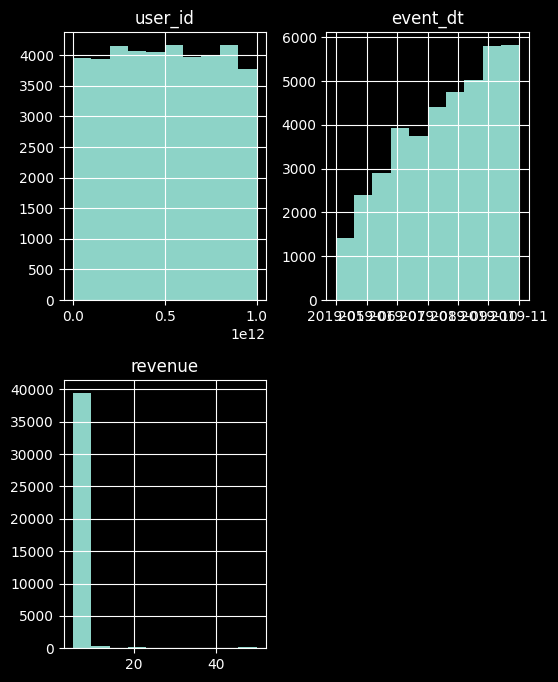

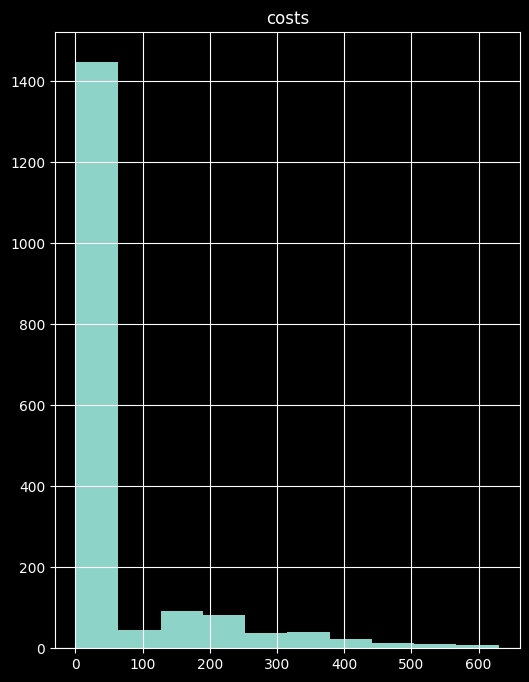

In [15]:
# check for any anomalies in data 
visits.hist(figsize=(6,8))
orders.hist(figsize=(6,8))
costs.hist(figsize=(6,8))

## Data preparation conclusion

Three datasets are available:
- server log with data about their visits,
- data upload on their purchases for this period,
- advertising expenses.


The data does not contain duplicates and gaps, all columns are named and brought to a convenient data format. There is no need to delete or fill in anything. The dataset is ready for analysis!

## Set functions for calculating and analyzing LTV, ROI, retention and conversion.

You are allowed to use the functions that you learned in the theory lessons.

These are the functions for calculating metric values:

- `get_profiles()` - to create user profiles,
- `get_retention()` - to calculate the Retention Rate,
- `get_conversion()` - for conversion calculation,
- `get_ltv()` - to calculate LTV.

As well as functions for plotting graphs:

- `filter_data()` - for data smoothing,
- `plot_retention()` - to plot the Retention Rate graph,
- `plot_conversion()` - for plotting a conversion graph,
- `plot_ltv_roi` - for visualizing LTV and ROI.

#### Function get_profiles()

In [16]:
# use the get_profiles() function to create user profiles.
def get_profiles(sessions, orders, ad_costs):

     # find the parameters of the first visits
     profiles = (
         sessions.sort_values(by=['user_id', 'session_start'])
         .groupby('user_id')
         .agg(
             {
                 'session_start': 'first',
                 'channel': 'first',
                 'device': 'first',
                 'region': 'first',
             }
         )
         .rename(columns={'session_start': 'first_ts'})
         .reset_index()
     )

     # for cohort analysis, determine the date of the first visit
     # and the first day of the month in which this visit occurred
     profiles['dt'] = profiles['first_ts'].dt.date
     profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

     # add a sign of paying users
     profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())

     # add flags for all events from event_names
     #for event in event_names:
         #if event in events['event_name'].unique():
            # profiles[event] = profiles['user_id'].isin(
                # events.query('event_name == @event')['user_id'].unique()
           #)

     # count the number of unique users
     # with the same source and date of attraction
     new_users = (
         profiles.groupby(['dt', 'channel'])
         .agg({'user_id': 'nunique'})
         .rename(columns={'user_id': 'unique_users'})
         .reset_index()
     )

     # combine spending on advertising and the number of attracted users
     ad_costs = ad_costs.merge(new_users, on=['dt', 'channel'], how='left')

     # divide advertising costs by the number of attracted users
     ad_costs['acquisition_cost'] = ad_costs['costs'] / ad_costs['unique_users']

     # add acquisition cost to profiles
     profiles = profiles.merge(
         ad_costs[['dt', 'channel', 'acquisition_cost']],
         on=['dt', 'channel'],
         how='left',
     )

     # organic user acquisition cost is zero
     profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

     return profiles

#### Function get_retention()

In [102]:
# use the get_retention() function to calculate the Retention Rate.
def get_retention(
     profiles,
     sessions,
     observation_date,
     horizon_days,
     dimensions=[],
     ignore_horizon=False,
):

     # add the payer column to the passed dimensions list
     dimensions = ['payer'] + dimensions

     # exclude users who did not "survive" to the analysis horizon
     last_suitable_acquisition_date = observation_date
     if not ignore_horizon:
         last_suitable_acquisition_date = observation_date - timedelta(
             days=horizon_days - 1
         )
     result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

     # collecting raw data to calculate retention
     result_raw = result_raw.merge(
         sessions[['user_id', 'session_start']], on='user_id', how='left'
     )
     result_raw['lifetime'] = (
         result_raw['session_start'] - result_raw['first_ts']
     ).dt.days

     # function for grouping the table according to the desired features
     def group_by_dimensions(df, dims, horizon_days):
         result = df.pivot_table(
             index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
         )
         cohort_sizes = (
             df.groupby(dims)
             .agg({'user_id': 'nunique'})
             .rename(columns={'user_id': 'cohort_size'})
         )
         result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
         result = result.div(result['cohort_size'], axis=0)
         result = result[['cohort_size'] + list(range(horizon_days))]
         result['cohort_size'] = cohort_sizes
         return result

     # get hold table
     result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

     # get a table of retention dynamics
     result_in_time = group_by_dimensions(
         result_raw, dimensions + ['dt'], horizon_days
     )

     # return both tables and raw data
     return result_raw, result_grouped, result_in_time

#### Function get_conversion()

In [18]:
# use the get_conversion() function to calculate the conversion.
def get_conversion(
     profiles,
     purchases,
     observation_date,
     horizon_days,
     dimensions=[],
     ignore_horizon=False,
):

     # exclude users who did not "survive" to the analysis horizon
     last_suitable_acquisition_date = observation_date
     if not ignore_horizon:
         last_suitable_acquisition_date = observation_date - timedelta(
             days=horizon_days - 1
         )
     result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

     # determine the date and time of the first purchase for each user
     first_purchases = (
         purchases.sort_values(by=['user_id', 'event_dt'])
         .groupby('user_id')
         .agg({'event_dt': 'first'})
         .reset_index()
     )

     # add purchase data to profiles
     result_raw = result_raw.merge(
         first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
     )

     # calculate lifetime for each purchase
     result_raw['lifetime'] = (
         result_raw['event_dt'] - result_raw['first_ts']
     ).dt.days

     # group by cohort if there is nothing in dimensions
     if len(dimensions) == 0:
         result_raw['cohort'] = 'All users'
         dimensions = dimensions + ['cohort']

     # function for grouping the table according to the desired features
     def group_by_dimensions(df, dims, horizon_days):
         result = df.pivot_table(
             index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
         )
         result = result.fillna(0).cumsum(axis = 1)
         cohort_sizes = (
             df.groupby(dims)
             .agg({'user_id': 'nunique'})
             .rename(columns={'user_id': 'cohort_size'})
         )
         result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
         # divide each "cell" in the row by the size of the cohort
         # and get the conversion rate
         result = result.div(result['cohort_size'], axis=0)
         result = result[['cohort_size'] + list(range(horizon_days))]
         result['cohort_size'] = cohort_sizes
         return result

     # get the conversion table
     result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

     # remove 'cohort' from dimensions for the conversion dynamics table
     if 'cohort' in dimensions:
         dimensions = []

     # get a table of conversion dynamics
     result_in_time = group_by_dimensions(
         result_raw, dimensions + ['dt'], horizon_days
     )

     # return both tables and raw data
     return result_raw, result_grouped, result_in_time

#### Function get_ltv()

In [19]:
# use the get_ltv() function to calculate LTV and ROI.
def get_ltv(
     profiles,
     purchases,
     observation_date,
     horizon_days,
     dimensions=[],
     ignore_horizon=False,
):

     # exclude users who did not "survive" to the analysis horizon
     last_suitable_acquisition_date = observation_date
     if not ignore_horizon:
         last_suitable_acquisition_date = observation_date - timedelta(
             days=horizon_days - 1
         )
     result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
     # add purchase data to profiles
     result_raw = result_raw.merge(
         purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
     )
     # calculate the user's lifetime for each purchase
     result_raw['lifetime'] = (
         result_raw['event_dt'] - result_raw['first_ts']
     ).dt.days
     # group by cohort if there is nothing in dimensions
     if len(dimensions) == 0:
         result_raw['cohort'] = 'All users'
         dimensions = dimensions + ['cohort']

     # grouping function according to the desired features
     def group_by_dimensions(df, dims, horizon_days):
         # build a "triangular" revenue table
         result = df.pivot_table(
             index=dims, columns='lifetime', values='revenue', aggfunc='sum'
         )
         # find the amount of revenue with accumulation
         result = result.fillna(0).cumsum(axis=1)
         # calculate cohort sizes
         cohort_sizes = (
             df.groupby(dims)
             .agg({'user_id': 'nunique'})
             .rename(columns={'user_id': 'cohort_size'})
         )
         # combine cohort sizes and revenue table
         result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
         # calculate LTV: divide each "cell" in the row by the size of the cohort
         result = result.div(result['cohort_size'], axis=0)
         # exclude all lifetimes that exceed the analysis horizon
         result = result[['cohort_size'] + list(range(horizon_days))]
         # restore cohort sizes
         result['cohort_size'] = cohort_sizes

         # collect dataframe with user data and CAC values,
         # adding parameters from dimensions
         cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()

         # calculate the average CAC by parameters from dimensions
         cac = (
             cac.groupby(dims)
             .agg({'acquisition_cost': 'mean'})
             .rename(columns={'acquisition_cost': 'cac'})
         )

         # calculate ROI: divide LTV by CAC
         roi = result.div(cac['cac'], axis=0)

         # remove rows with infinite ROI
         roi = roi[~roi['cohort_size'].isin([np.inf])]

         # restore cohort sizes in the ROI table
         roi['cohort_size'] = cohort_sizes

         # add CAC to ROI table
         roi['cac'] = cac['cac']

         # in the final table we leave the sizes of cohorts, CAC
         # and ROI in lifetimes that do not exceed the analysis horizon
         roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

         # return LTV and ROI tables
         return result, roi

     # get LTV and ROI tables
     result_grouped, roi_grouped = group_by_dimensions(
         result_raw, dimensions, horizon_days
     )

     # for dynamics tables remove 'cohort' from dimensions
     if 'cohort' in dimensions:
         dimensions = []

     # get tables of LTV and ROI dynamics
     result_in_time, roi_in_time = group_by_dimensions(
         result_raw, dimensions + ['dt'], horizon_days
     )

     return(
         result_raw, # raw data
         result_grouped, # LTV table
         result_in_time, # LTV dynamics table
         roi_grouped, # ROI table
         roi_in_time, # ROI dynamics table
     )

#### Function filter_data()

In [20]:
# use the filter_data() function to smooth the data.
def filter_data(df, window):
     # apply a moving average for each column
     for column in df.columns.values:
         df[column] = df[column].rolling(window).mean()
     return df

#### Function plot_retention()

In [21]:
# use the plot_retention() function to plot the Retention Rate.
def plot_retention(retention, retention_history, horizon, window=7):

     # set the grid size for charts
     plt.figure(figsize=(15, 10))

     # exclude cohort sizes and first day retention
     retention = retention.drop(columns=['cohort_size', 0])
     # leave only the desired lifetime in the dynamics table
     retention_history = retention_history.drop(columns=['cohort_size'])[
         [horizon - 1]
     ]

     # if there is only payer in the indexes of the hold table,
     # add the second feature - cohort
     if retention.index.nlevels == 1:
         retention['cohort'] = 'All users'
         retention = retention.reset_index().set_index(['cohort', 'payer'])

     # in the graph table - two columns and two rows, four cells
     # in the first we build retention curves for paying users
     ax1 = plt.subplot(2, 2, 1)
     retention.query('payer == True').droplevel('payer').T.plot(
         grid=True, ax=ax1
     )
     plt.legend()
     plt.xlabel('Lifetime')
     plt.title('Retain paying users')

     # in the second cell we build non-paying retention curves
     # vertical axis - from the graph from the first cell
     ax2 = plt.subplot(2, 2, 2, sharey=ax1)
     retention.query('payer == False').droplevel('payer').T.plot(
         grid=True, ax=ax2
     )
     plt.legend()
     plt.xlabel('Lifetime')
     plt.title('Retain non-paying users')

     # in the third cell - the dynamics of retention of paying
     ax3 = plt.subplot(2, 2, 3)
     # get the column names for the pivot table
     columns = [
         name
         for name in retention_history.index.names
         if name not in ['dt', 'payer']
     ]
     # filter data and plot
     filtered_data = retention_history.query('payer == True').pivot_table(
         index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax3)
     plt.xlabel('Purchase date')
     plt.title(
         'Retention dynamics of paying users on the {}th day'.format(
             horizon
         )
     )

     # in the fourth cell - the dynamics of retention of non-paying
     ax4 = plt.subplot(2, 2, 4, sharey=ax3)
     # filter data and plot
     filtered_data = retention_history.query('payer == False').pivot_table(
         index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax4)
     plt.xlabel('Purchase date')
     plt.title(
         'Retention dynamics of non-paying users on the {}th day'.format(
             horizon
         )
     )
    
     plt.tight_layout()
     plt.show()

#### Function plot_conversion()

In [22]:
# use the plot_conversion() function to plot the conversion graph.
def plot_conversion(conversion, conversion_history, horizon, window=7):

     # set the grid size for charts
     plt.figure(figsize=(15, 5))

     # exclude cohort sizes
     conversion = conversion.drop(columns=['cohort_size'])
     # leave only the desired lifetime in the dynamics table
     conversion_history = conversion_history.drop(columns=['cohort_size'])[
         [horizon - 1]
     ]

     # first chart - conversion curves
     ax1 = plt.subplot(1, 2, 1)
     conversion.T.plot(grid=True, ax=ax1)
     plt.legend()
     plt.xlabel('Lifetime')
     plt.title('User Conversion')

     # second graph - conversion dynamics
     ax2 = plt.subplot(1, 2, 2, sharey=ax1)
     columns = [
         # all index columns except date will become pivot table columns
         name for name in conversion_history.index.names if name not in ['dt']
     ]
     filtered_data = conversion_history.pivot_table(
         index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax2)
     plt.xlabel('Purchase date')
     plt.title('Dynamics of user conversion on the {}-th day'.format(horizon))

     plt.tight_layout()
     plt.show()

#### Function plot_ltv_roi()

In [23]:
# use the function plot_ltv_roi - to visualize LTV and ROI.
def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

     # set the grid for drawing charts
     plt.figure(figsize=(20, 20))

     # exclude cohort sizes from table ltv
     ltv = ltv.drop(columns=['cohort_size'])
     # leave only the desired lifetime in the ltv dynamics table
     ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

     # write the cost of attraction in a separate frame
     cac_history = roi_history[['cac']]

     # exclude cohort sizes and cac from table roi
     roi = roi.drop(columns=['cohort_size', 'cac'])
     # leave only the desired lifetime in the roi dynamics table
     roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
         [horizon - 1]
     ]

     # first graph - ltv curves
     ax1 = plt.subplot(2, 3, 1)
     ltv.T.plot(grid=True, ax=ax1)
     plt.legend()
     plt.xlabel('Lifetime')
     plt.title('LTV')

     # second graph - ltv dynamics
     ax2 = plt.subplot(2, 3, 2, sharey=ax1)
     # all index columns except date will become pivot table columns
     columns = [name for name in ltv_history.index.names if name not in ['dt']]
     filtered_data = ltv_history.pivot_table(
         index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax2)
     plt.xlabel('Purchase date')
     plt.title('Dynamic LTV of users on the {}th day'.format(horizon))

     # the third graph is the dynamics of cac
     ax3 = plt.subplot(2, 3, 3, sharey=ax1)
     # all index columns except date will become pivot table columns
     columns = [name for name in cac_history.index.names if name not in ['dt']]
     filtered_data = cac_history.pivot_table(
         index='dt', columns=columns, values='cac', aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax3)
     plt.xlabel('Purchase date')
     plt.title('User Acquisition Cost Trend')

     # fourth graph - roi curves
     ax4 = plt.subplot(2, 3, 4)
     roi.T.plot(grid=True, ax=ax4)
     plt.axhline(y=1, color='red', linestyle='--', label='Payback Level')
     plt.legend()
     plt.xlabel('Lifetime')
     plt.title('ROI')

     # the fifth graph is the dynamics of roi
     ax5 = plt.subplot(2, 3, 5, sharey=ax4)
     # all index columns except date will become pivot table columns
     columns = [name for name in roi_history.index.names if name not in ['dt']]
     filtered_data = roi_history.pivot_table(
         index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
     )
     filter_data(filtered_data, window).plot(grid=True, ax=ax5)
     plt.axhline(y=1, color='red', linestyle='--', label='Payback Level')
     plt.xlabel('Purchase date')
     plt.title('Dynamic ROI of users on the {}th day'.format(horizon))

     plt.tight_layout()
     plt.show()

The functions used simplify and speed up the work on the project!

## EDA

- It is necessary to create user profiles, determine the minimum and maximum dates of attraction.
- Find out from which countries users come to the application and which country has the most paying users. Let's build a table that reflects the number of users and the share of paying from each country.
- Researching what devices customers use and what devices paying users prefer. Let's build a table showing the number of users and share of paying for each device.
- We will study advertising sources of attraction and determine the channels from which the most paying users came. Let's build a table that reflects the number of users and the share of paying for each acquisition channel.

In [24]:
# get user profiles
profiles = get_profiles(visits, orders, costs)
profiles.head(10)


,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769
5,34186288,2019-05-09 17:29:23,organic,Android,United States,2019-05-09,2019-05-01,False,0.000000
6,38448301,2019-08-16 11:56:00,organic,Android,United States,2019-08-16,2019-08-01,False,0.000000
7,46006712,2019-06-30 03:46:29,AdNonSense,Android,France,2019-06-30,2019-06-01,True,1.008000
8,58263264,2019-05-11 19:18:43,FaceBoom,iPhone,United States,2019-05-11,2019-05-01,False,1.128205
9,59835779,2019-05-11 21:13:47,MediaTornado,iPhone,United States,2019-05-11,2019-05-01,False,0.250435


<class 'pandas.core.frame.DataFrame'>
Int64Index: 150008 entries, 0 to 150007
Data columns (total 9 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   user_id           150008 non-null  int64         
 1   first_ts          150008 non-null  datetime64[ns]
 2   channel           150008 non-null  object        
 3   device            150008 non-null  object        
 4   region            150008 non-null  object        
 5   dt                150008 non-null  object        
 6   month             150008 non-null  datetime64[ns]
 7   payer             150008 non-null  bool          
 8   acquisition_cost  150008 non-null  float64       
dtypes: bool(1), datetime64[ns](2), float64(1), int64(1), object(4)
memory usage: 10.4+ MB


array([[<AxesSubplot:title={'center':'user_id'}>,
        <AxesSubplot:title={'center':'first_ts'}>],
       [<AxesSubplot:title={'center':'month'}>,
        <AxesSubplot:title={'center':'acquisition_cost'}>]], dtype=object)

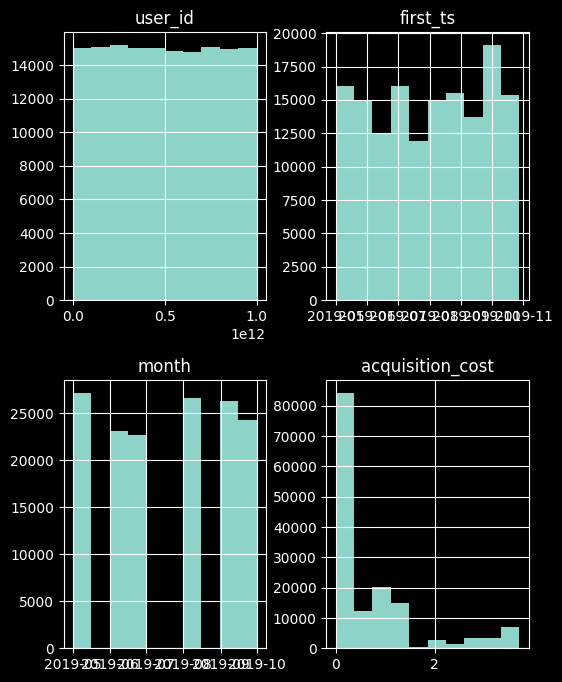

In [25]:
profiles.info()
profiles.hist(figsize=(6,8))

In [26]:
min_date = profiles.sort_values(by='dt', ascending=True).iloc[0]['dt']
print(f'Minimum user acquisition date: {min_date} ') 

Minimum user acquisition date: 2019-05-01 


In [27]:
max_date = profiles.sort_values(by='dt', ascending=False).iloc[0]['dt']
print(f'Maximum user acquisition date: {max_date}')

Maximum user acquisition date: 2019-10-27


In [28]:
# calculate conversion by region
profiles_grouped = profiles.pivot_table(index='region', columns='payer', values='user_id', aggfunc=['count'])
profiles_grouped['sum'] = profiles.groupby('region')['user_id'].count()
profiles_grouped['conversion'] = ((profiles_grouped.loc[:, ('count', True)] / profiles_grouped['sum'])*100).round(2)
profiles_grouped = profiles_grouped.sort_values(by='conversion', ascending=False)
profiles_grouped

count           sum conversion
payer          False  True                   
region                                       
United States  93100  6902  100002       6.90
Germany        14365   616   14981       4.11
UK             16875   700   17575       3.98
France         16787   663   17450       3.80

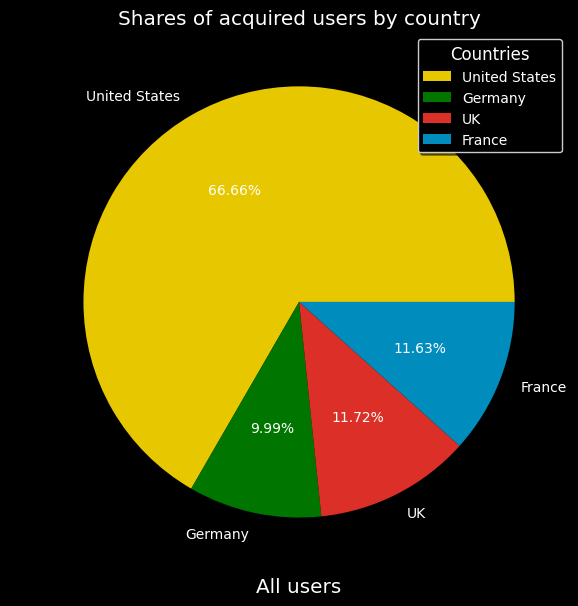

In [29]:
# visualize share of users acquired by region

colors = ['#e6c700', '#007500', '#db2f27', '#008cbc']

# Plot the pie chart with the specified color scheme
profiles_grouped['sum'].plot(kind='pie', grid=True, figsize=(7,7), autopct='%1.2f%%', colors=colors)

# Set the chart title and labels
plt.title('Shares of acquired users by country', fontsize='x-large')
plt.xlabel('All users', fontsize='x-large')
plt.ylabel(' ')
plt.legend(loc = 'upper right', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

Judging by the graph, 67% of attracted users are in the USA, 12% in England and France, 10% in Germany.

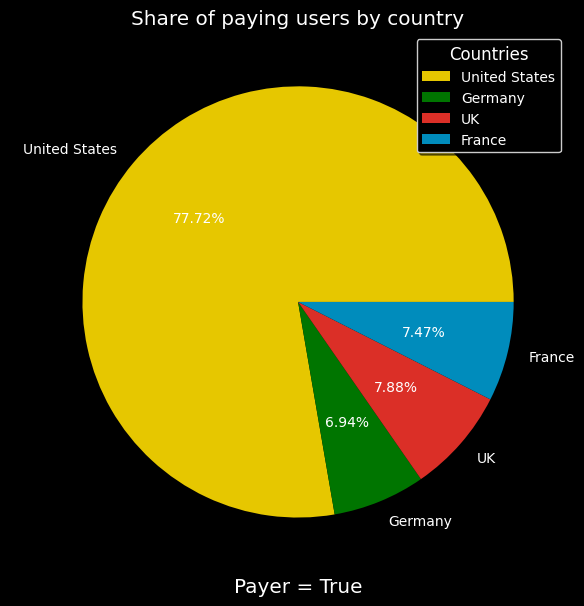

In [30]:
# Visualize the share of paying users by region
profiles_grouped_true = profiles_grouped.loc[:, ('count', True)]
profiles_grouped_true.plot(kind='pie', figsize=(7,7), autopct='%1.2f%%', colors = colors)

# Set the chart title and labels
plt.title('Share of paying users by country', fontsize='x-large')
plt.xlabel('Payer = True', fontsize='x-large')
plt.ylabel(' ', fontsize='small')
plt.legend(loc = 'upper right', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

Based on the graph, it can be seen that 78% of paying users are from the USA, 8% from England, 7% from Germany and France.

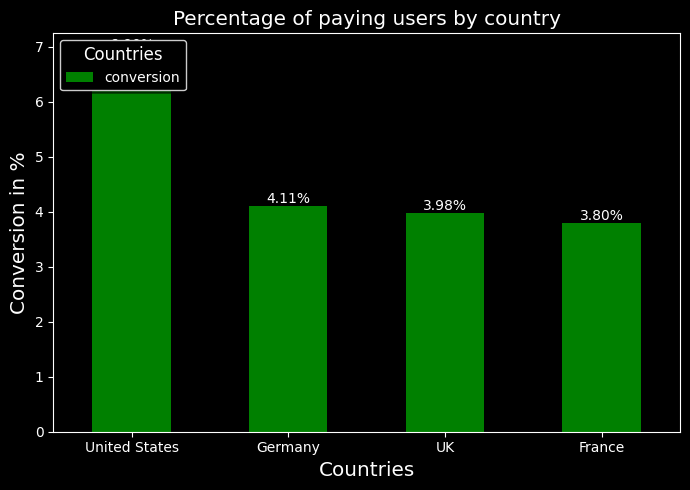

In [31]:
# Visualize conversion by country
ax = profiles_grouped['conversion'].plot(kind='bar',  rot=0, color='g', figsize=(7, 5))

# Set the chart title and labels
plt.title('Percentage of paying users by country', fontsize='x-large')
plt.xlabel('Countries', fontsize='x-large')
plt.ylabel('Conversion in %', fontsize='x-large')
plt.legend(loc='upper left', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

# Annotate each bar with its height (conversion percentage)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}%', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize='medium')

plt.tight_layout()
plt.show()

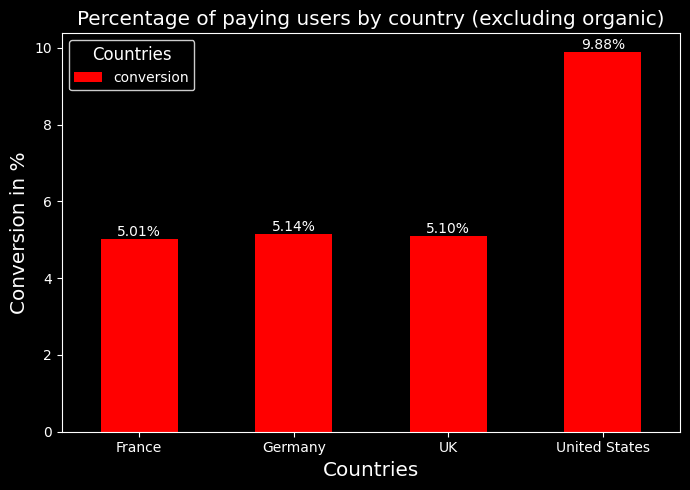

In [32]:
# Percentage of paying users by region excluding organic
profiles_n_o = profiles.query('channel != "organic"') #exclude organic users

profiles_grouped_n_o = profiles_n_o.pivot_table(index='region', columns='payer', values='user_id', aggfunc=['count'])
profiles_grouped_n_o['sum'] = profiles_n_o.groupby('region')['user_id'].count()
profiles_grouped_n_o['conversion'] = ((profiles_grouped_n_o.loc[:, ('count', True)] / profiles_grouped_n_o['sum'])*100).round(2)

ax = profiles_grouped_n_o['conversion'].plot(kind='bar', rot=0, color='r', figsize=(7, 5))



# Set the chart title and labels
plt.title('Percentage of paying users by country (excluding organic)', fontsize='x-large')
plt.xlabel('Countries', fontsize='x-large')
plt.ylabel('Conversion in %', fontsize='x-large')
plt.legend(loc='upper left', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

# Annotate each bar with its height (conversion percentage)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}%', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize='medium')

plt.tight_layout()
plt.show()

According to the calculations and the displayed histogram, the percentage of paying users relative to acquired users (excluding organic users) is: 9.88% in the US, 5.14% in Germany, 5.10% in England and 5.01% in France.

In [33]:
# calculate conversion by platform
profiles_grouped_d = profiles.pivot_table(index='device', columns='payer', values='user_id', aggfunc=['count'])
profiles_grouped_d['sum'] = profiles.groupby('device')['user_id'].count()
profiles_grouped_d['conversion'] = ((profiles_grouped_d.loc[:, ('count', True)] / profiles_grouped_d['sum'])*100).round(2)
profiles_grouped_d = profiles_grouped_d.sort_values(by='conversion', ascending=False)
profiles_grouped_d

count          sum conversion
payer    False  True                  
device                                
Mac      28130  1912  30042       6.36
iPhone   51097  3382  54479       6.21
Android  32982  2050  35032       5.85
PC       28918  1537  30455       5.05

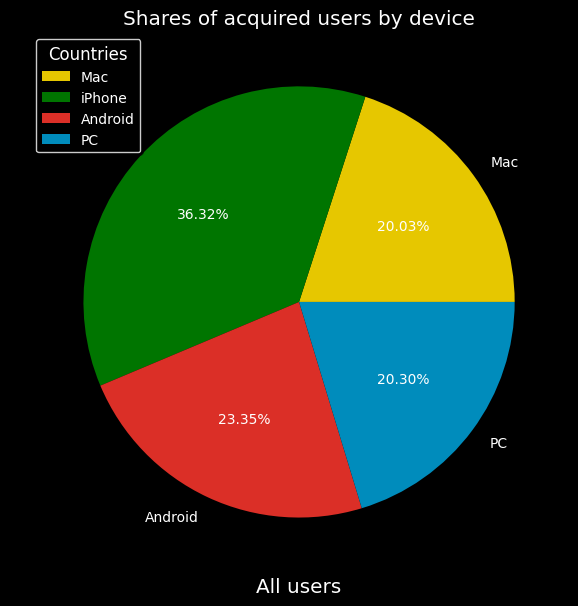

In [34]:
# visualize share of users acquired by platform
profiles_grouped_d['sum'].plot(kind='pie', grid=True, figsize=(7, 7), autopct='%1.2f%%', colors=colors)

# Set the chart title and labels
plt.title('Shares of acquired users by device', fontsize='x-large')
plt.xlabel('All users', fontsize='x-large')
plt.ylabel(' ')
plt.legend(loc='upper left', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

plt.show()

According to the graph, 36% of attracted users use the application from their Iphone, 20% of users on PC and Mac, 23% use Android.

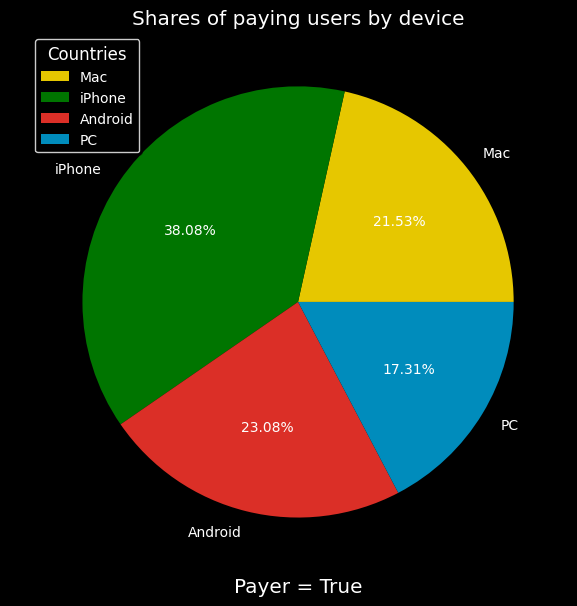

In [35]:
# Visualize the share of paying users by platform
profiles_grouped_d_true = profiles_grouped_d.loc[:, ('count', True)]
profiles_grouped_d_true.plot(kind='pie', figsize=(7,7), autopct='%1.2f%%', colors=colors)

# Set the chart title and labels
plt.title('Shares of paying users by device', fontsize='x-large')
plt.xlabel('Payer = True', fontsize='x-large')
plt.ylabel(' ', fontsize='small')
plt.legend(loc = 'upper left', title='Countries', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

According to the data, it can be concluded that among paying users there are 38% iPhone owners, 23% Android, 22% Mac, 17% PC.

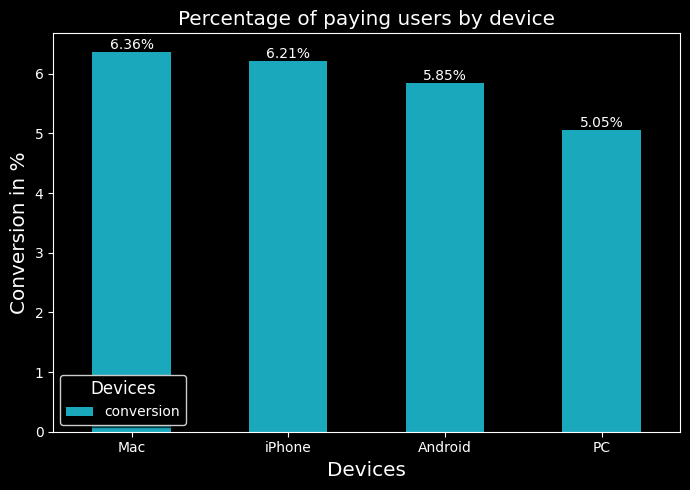

In [36]:
# Visualize conversion by platform
ax = profiles_grouped_d['conversion'].plot(kind='bar', rot=0, color='#1aa9bc', figsize=(7, 5))

# Set the chart title and labels
plt.title('Percentage of paying users by device', fontsize='x-large')
plt.xlabel('Devices', fontsize='x-large')
plt.ylabel('Conversion in %', fontsize='x-large')
plt.legend(loc='lower left', title='Devices', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

# Annotate each bar with its height (conversion percentage)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}%', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize='medium')

plt.tight_layout()
plt.show()

Based on calculations and visualizations, we can conclude that the conversion of Mac users is the highest at 6.36%, 6.21% of iPhone users are converted into buyers, PC - 5.05%, and Android - 5.85%.

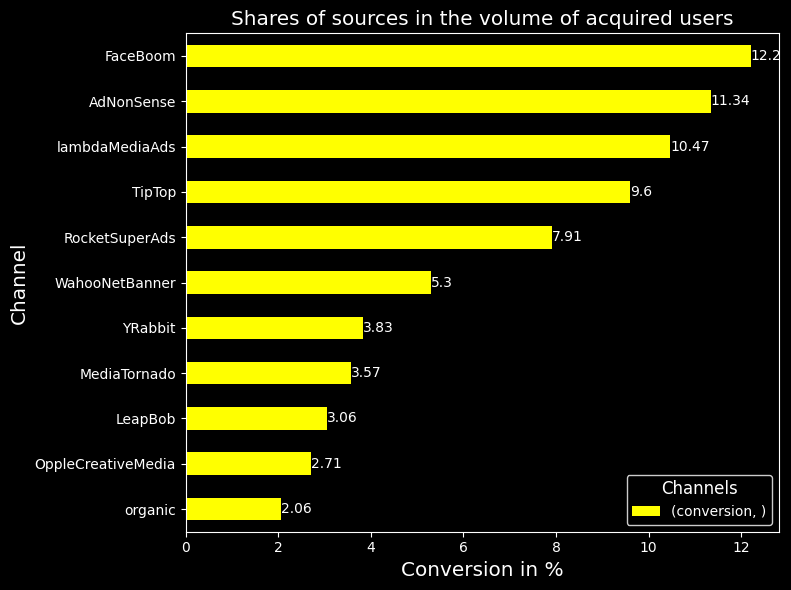

In [37]:
# calculate conversion by channel
profiles_grouped_c = profiles.pivot_table(index='channel', columns='payer', values='user_id', aggfunc=['count'])
profiles_grouped_c['sum'] = profiles.groupby('channel')['user_id'].count()
profiles_grouped_c['conversion'] = ((profiles_grouped_c.loc[:, ('count', True)] / profiles_grouped_c['sum'])*100).round(2)

# Sort the DataFrame by 'conversion' in ascending order
profiles_grouped_c_sorted = profiles_grouped_c.sort_values(by='conversion', ascending=True)

# Create a horizontal bar chart with a specified figure size
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the horizontal bar chart
profiles_grouped_c_sorted.drop(['count', 'sum'], axis=1).plot(kind='barh', color='yellow', ax=ax)

# Set the chart title and labels
plt.title('Shares of sources in the volume of acquired users', fontsize='x-large')
plt.xlabel('Conversion in %', fontsize='x-large')
plt.ylabel('Channel', fontsize='x-large')
plt.legend(title='Channels', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

# Add annotations with the values to the bars
for i, v in enumerate(profiles_grouped_c_sorted['conversion']):
    ax.text(v, i, str(v), ha='left', va='center', fontsize='medium')

plt.tight_layout()
plt.show()

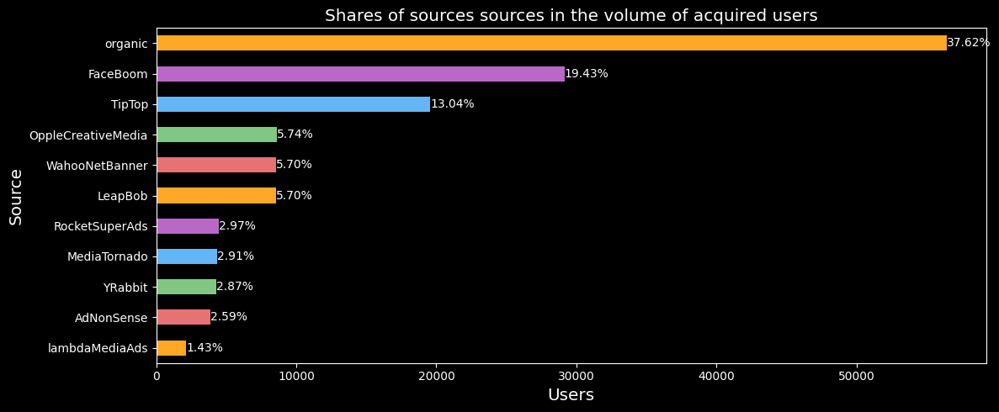

In [38]:
# Shares of sources in the volume of acquired users
profiles_grouped_c_sorted = profiles_grouped_c.sort_values(by='sum', ascending=True)

# Calculate the total sum of users for percentage calculation
total_users = profiles_grouped_c_sorted['sum'].sum()

new_colors = ['#ffa726', '#e57373', '#81c784', '#64b5f6', '#ba68c8']

# Create a horizontal bar chart with a specified figure size and custom colors
fig, ax = plt.subplots(figsize=(12, 5))
profiles_grouped_c_sorted['sum'].plot(kind='barh', color=new_colors, ax=ax)

# Set the chart title and labels
plt.title('Shares of sources sources in the volume of acquired users', fontsize='x-large')
plt.xlabel('Users', fontsize='x-large')
plt.ylabel('Source', fontsize='x-large')

# Add annotations with the percentage values to the bars
for i, v in enumerate(profiles_grouped_c_sorted['sum']):
     percent = (v/total_users) * 100
     ax.text(v, i, f'{percent:.2f}%', ha='left', va='center', fontsize='medium')

plt.tight_layout()
plt.show()

The lion's share, almost 38% of users come to the app from an organic channel. Slightly less than 20% of users go from ads in the FaceBoom channel, 13% from TipTop. The share of other channels does not exceed 6% for each.

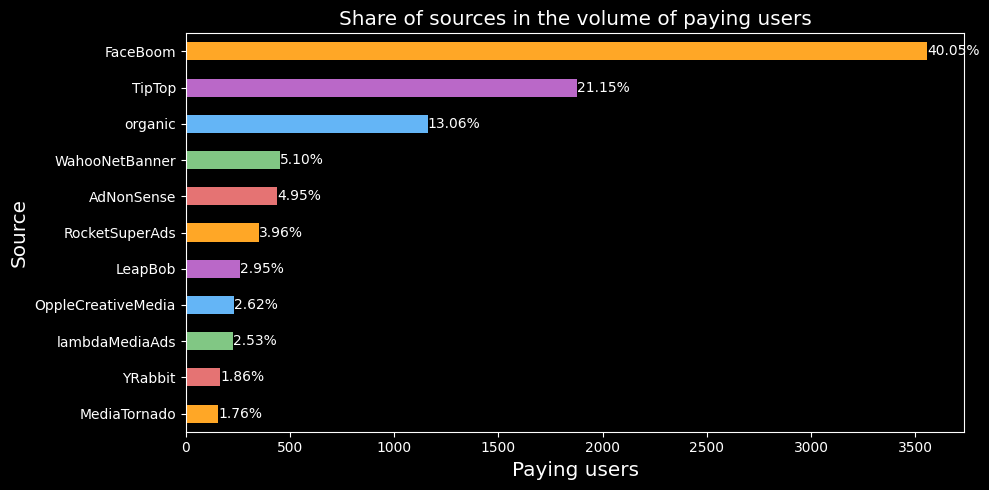

In [39]:
# Shares of sources in the volume of paying users
profiles_grouped_c_true_sorted = profiles_grouped_c.loc[:, ('count', True)].sort_values(ascending=True)

# Calculate the total count of True values
total_true_count = profiles_grouped_c_true_sorted.sum()

# Create a horizontal bar chart with a specified figure size and custom colors
fig, ax = plt.subplots(figsize=(10, 5))
profiles_grouped_c_true_sorted.plot(kind='barh', color=new_colors, ax=ax)

# Set the chart title and labels
plt.title('Share of sources in the volume of paying users', fontsize='x-large')
plt.xlabel('Paying users', fontsize='x-large')
plt.ylabel('Source', fontsize='x-large')

# Add annotations with the percentage values to the bars
for i, v in enumerate(profiles_grouped_c_true_sorted):
     percent = (v/total_true_count) * 100
     ax.text(v, i, f'{percent:.2f}%', ha='left', va='center', fontsize='medium')

plt.tight_layout()
plt.show()

Most of all paying users are brought by the FaceBoom source - 40%. In second place is TipTop - 21% of paying users come from there. From organic search, the conversion is only 13%. Other sources convert no more than 6% each.

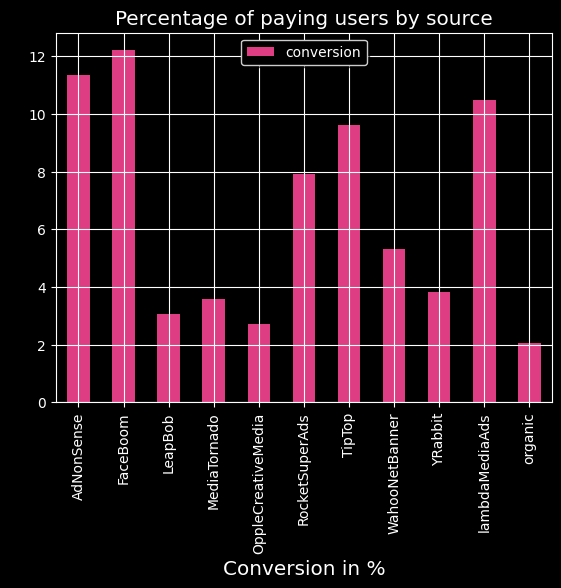

In [40]:
# Visualize conversion by source
profiles_grouped_c['conversion'].plot(kind='bar', grid=True, rot=90, color=['#de3d83'])

# Set the chart title and labels
plt.title('Percentage of paying users by source', fontsize='x-large')
plt.xlabel('Conversion in %', fontsize='x-large')
plt.ylabel(' ', fontsize='small')
plt.legend(loc = 'upper center', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

Judging by the calculations and based on the graphs, we can conclude that the most profitable traffic sources are:
- faceboom,
- AdNonSense,
- LambdaMediaAds,
- Tip top.

Judging only by the level of conversion.

Given the absolute volume of referred users, the most profitable channels are:
- faceboom,
- tiptop,
- AdNonSense.

## Marketing research

- Let's calculate the total amount of marketing expenses during the observation period.
- Let's determine how spending is distributed among advertising sources, that is, how much money was spent on each source.
- We visualize the dynamics of changes in expenses over time (by weeks and months) for each source.
- Calculate how much it cost on average to attract one user (CAC) from each source.

In [41]:
costs_grouped = costs.pivot_table(index='channel', aggfunc={'dt': 'count', 'costs': 'sum'})
costs_total = costs_grouped['costs'].sum().round(2)
print(f'Total marketing spend is: {costs_total} c.u.')

Total marketing spend is: 105497.3 c.u.


In [42]:
costs_grouped['percent'] = round((costs_grouped['costs'] / costs_total * 100), 2)
costs_grouped_sorted = costs_grouped.drop(['dt'], axis=1).sort_values(by='percent', ascending=True)

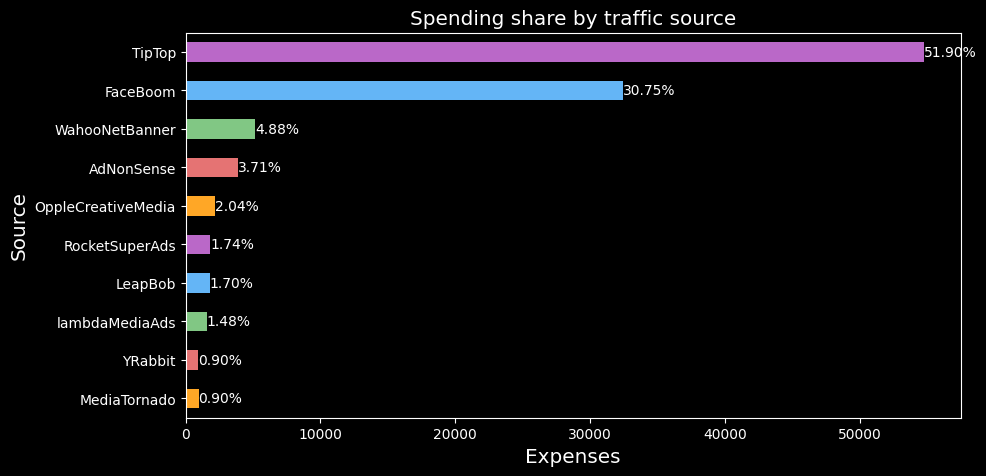

In [43]:
# count spending percentage by source
costs_grouped['percent'] = round((costs_grouped['costs'] / costs_total * 100), 2)
costs_grouped_sorted = costs_grouped.drop(['dt'], axis=1).sort_values(by='percent', ascending=True)

# Create a horizontal bar chart with a specified figure size and custom colors
fig, ax = plt.subplots(figsize=(10, 5))

# Use the 'costs' column for the bars and display the 'percent' column as annotations
costs_grouped_sorted['costs'].plot(kind='barh', color=new_colors, ax=ax)

# Set the chart title and labels
plt.title('Spending share by traffic source', fontsize='x-large')
plt.xlabel('Expenses', fontsize='x-large')
plt.ylabel('Source', fontsize='x-large')

# Add annotations with the percentages to the bars (displayed as percentages)
for i, percent in enumerate(costs_grouped_sorted['percent']):
     cost = costs_grouped_sorted['costs'].iloc[i]
     ax.text(cost, i, f'{percent:.2f}%', ha='left', va='center', fontsize='medium')

plt.show()

The app was advertised in 10 traffic sources. A total of $105,500 was spent on advertising, which was allocated to 180 companies for each source. Half of the budget went to the TipTop channel and a third to the FaceBoom. Other channels receive significantly less funding.

In [44]:
# Convert the 'dt' column to a datetime type
costs['dt'] = pd.to_datetime(costs['dt'])

# Set the 'dt' column as the DataFrame index
costs = costs.set_index('dt')

# Aggregate by month and source
costs_monthly = costs.groupby(['channel', pd.Grouper(freq='M')]).sum()

# Aggregate by week and source
costs_weekly = costs.groupby(['channel', pd.Grouper(freq='W-MON')]).sum()

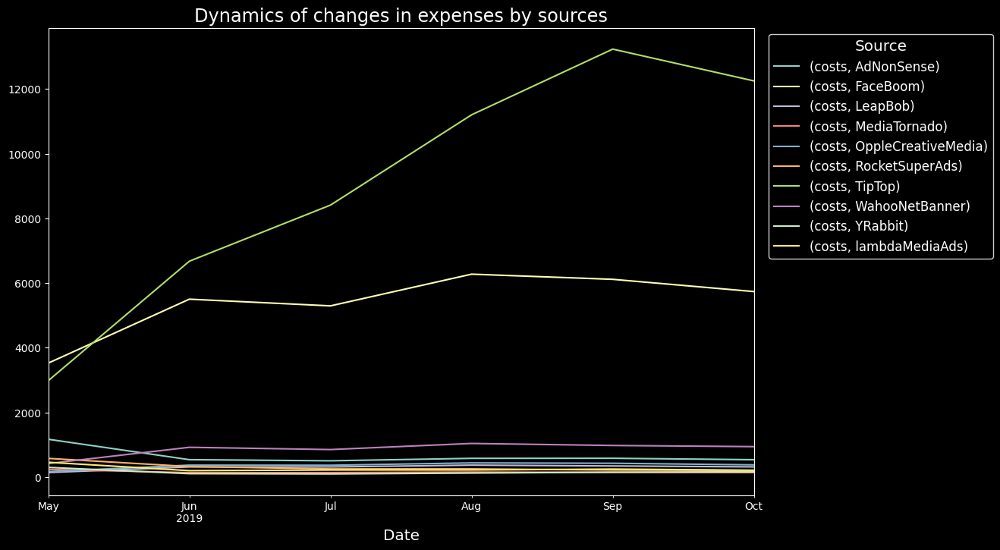

In [69]:
# Let's build graphs
fig, ax = plt.subplots(figsize=(12,8))
 
# Chart by month
costs_monthly.unstack(0).plot(ax=ax)

# Set up the legend and title
ax.legend(loc='upper center', bbox_to_anchor=(1.18, 1.0), title='Source', fontsize='large', title_fontsize='x-large', fancybox=True, shadow=True)
ax.set_title('Dynamics of changes in expenses by sources', fontsize='xx-large')
plt.xlabel('Date', fontsize='x-large')

# Display the graph
plt.show()

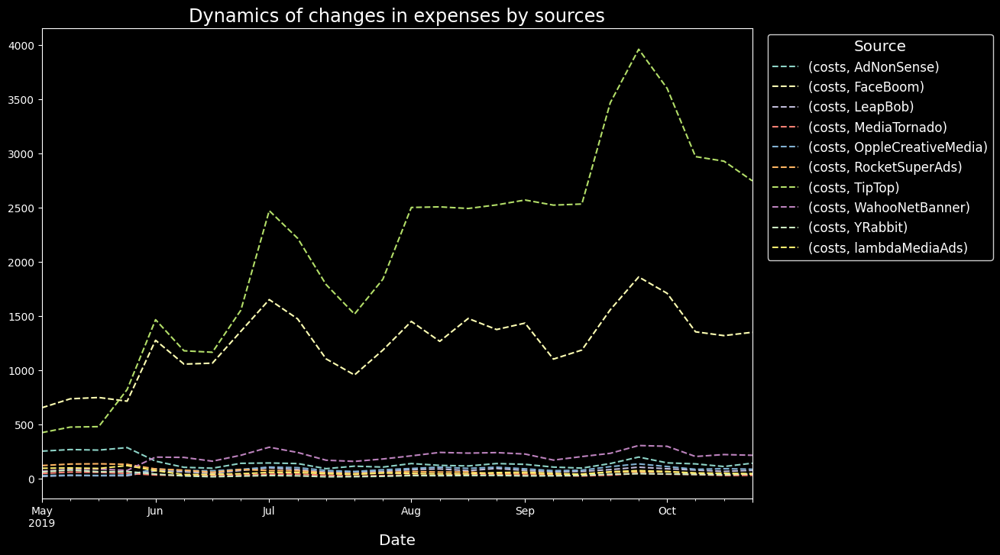

In [70]:
# Let's build graphs
fig, ax = plt.subplots(figsize=(12,8))

# Graph by week
costs_weekly.unstack(0).plot(ax=ax, linestyle='--')

# Set up the legend and title
ax.legend(loc='upper center', bbox_to_anchor=(1.18, 1.0), title='Source', fontsize='large', title_fontsize='x-large', fancybox=True, shadow=True)
ax.set_title('Dynamics of changes in expenses by sources', fontsize='xx-large')
plt.xlabel('Date', fontsize='x-large')

# Display the graph
plt.show()

Judging by the graph and calculations above, it is obvious that the advertising budget of the two acquisition channels was initially many times larger than for other traffic sources. Starting in June, TipTop costs skyrocket, and their decline begins in the second week of September. In the same period of time, FaceBoom spending also experiences a slight ups and downs, but not nearly as dramatic. The graphs show that the rest of the traffic sources practically did not sponsor.

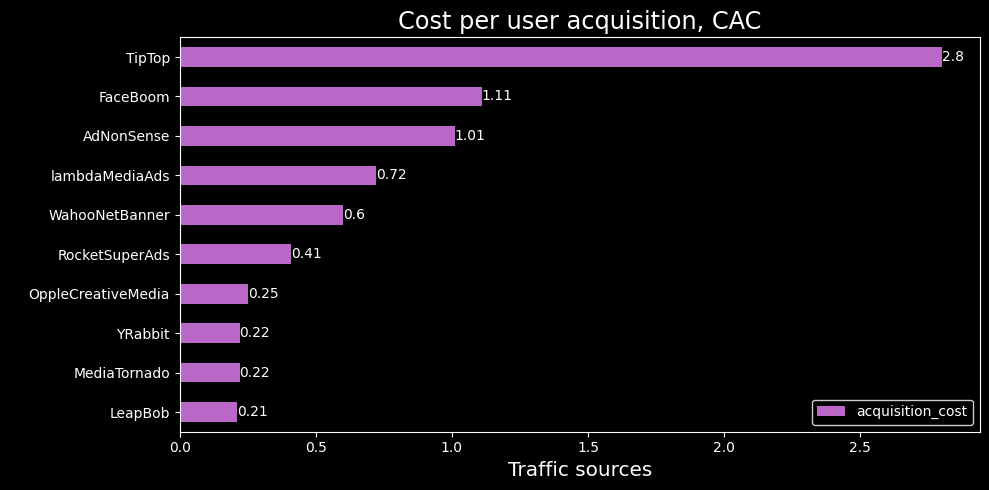

In [81]:
# calculate the cost of attracting one user for each channel
cac_mean = profiles.groupby('channel')['acquisition_cost'].mean().sort_values(ascending=True).round(2)

fig, ax = plt.subplots(figsize=(10, 5))

cac_mean.plot(kind='barh', color='#ba68c8')

plt.title('Cost per user acquisition, CAC', fontsize='xx-large')
plt.xlabel('Traffic sources', fontsize='x-large')
plt.ylabel(' ', fontsize='small')
plt.legend(loc = 'lower right', fontsize='medium', title_fontsize='large', fancybox=True, shadow=True)

# Add annotations with the values to the bars
for i, v in enumerate(cac_mean):
    ax.text(v, i, str(v), ha='left', va='center', fontsize='medium')

plt.tight_layout()
plt.show()

The cost of attracting one user varies greatly for different channels. The TipTop channel is several orders of magnitude more expensive than all the others. FaceBoom, AdNonsense, lambdamediaAds cost about the same and are half the price of TipTop. It is worth paying attention to other channels for further planning advertising campaigns, since the cost of attracting them is lower.

Text(0, 0.5, 'Length, s')

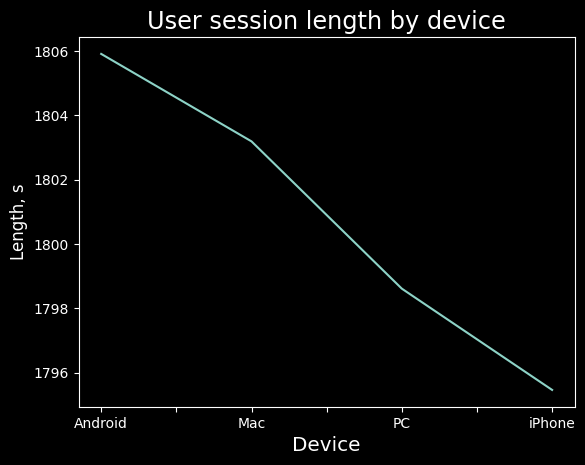

In [87]:
# calculate the average user session length by device
visits['session_long'] = visits['session_end'] - visits['session_start']
visits['session_long_sec'] = visits['session_long'].dt.total_seconds()
visits['session_start_datetime'] = pd.to_datetime(visits['session_start'])
visits.groupby('device')['session_long_sec'].mean().round(2).plot()

plt.title('User session length by device', fontsize='xx-large')
plt.xlabel('Device', fontsize='x-large')
plt.ylabel('Length, s', fontsize='large')

Average session lengths across desktop and mobile devices should be different from each other. Logically, it cannot be such that the lengths of the sessions are the same. Therefore, we can conclude that the data do not take into account the possibility of such a study, which of course affects the quality of the analysis.

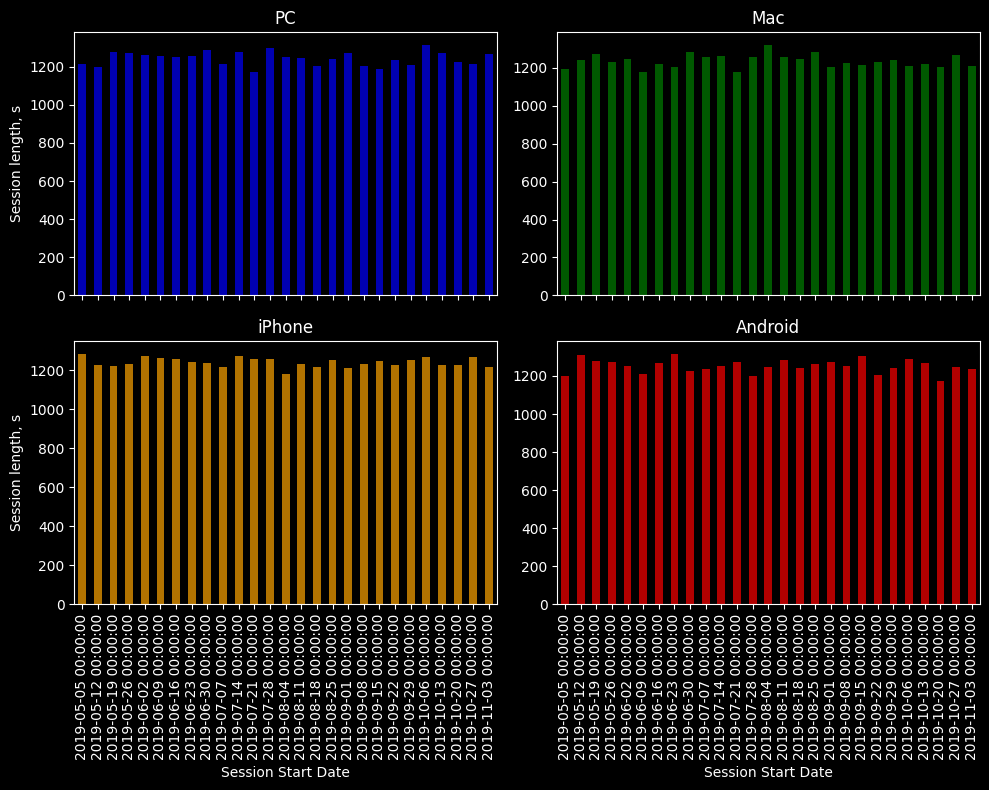

In [94]:
# Let's study the dynamics of session lengths on different devices  there may be seasonality
visits_grouped_pc = visits[visits['device'] == 'PC'].groupby(pd.Grouper(key='session_start_datetime', freq='W'))['session_long_sec'].median()
visits_grouped_mac = visits[visits['device'] == 'Mac'].groupby(pd.Grouper(key='session_start_datetime', freq='W'))['session_long_sec'].median()
visits_grouped_iphone = visits[visits['device'] == 'iPhone'].groupby(pd.Grouper(key='session_start_datetime', freq='W'))['session_long_sec'].median()
visits_grouped_android = visits[visits['device'] == 'Android'].groupby(pd.Grouper(key='session_start_datetime', freq='W'))['session_long_sec'].median()

# Create a 2x2 subplot layout for 4 plots
fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=True)

# Plot the data for each device in its respective subplot
visits_grouped_pc.plot(kind='bar', ax=axes[0, 0], color='blue', alpha=0.7)
visits_grouped_mac.plot(kind='bar', ax=axes[0, 1], color='green', alpha=0.7)
visits_grouped_iphone.plot(kind='bar', ax=axes[1, 0], color='orange', alpha=0.7)
visits_grouped_android.plot(kind='bar', ax=axes[1, 1], color='red', alpha=0.7)

# Set titles and labels for each subplot
axes[0, 0].set_title('PC')
axes[0, 1].set_title('Mac')
axes[1, 0].set_title('iPhone')
axes[1, 1].set_title('Android')

# set labels
axes[1, 0].set_xlabel('Session Start Date')
axes[1, 1].set_xlabel('Session Start Date')
axes[0, 0].set_ylabel('Session length, s')
axes[1, 0].set_ylabel('Session length, s')

# Adjust spacing between subplots
plt.tight_layout()

# Show the combined table of plots
plt.show()


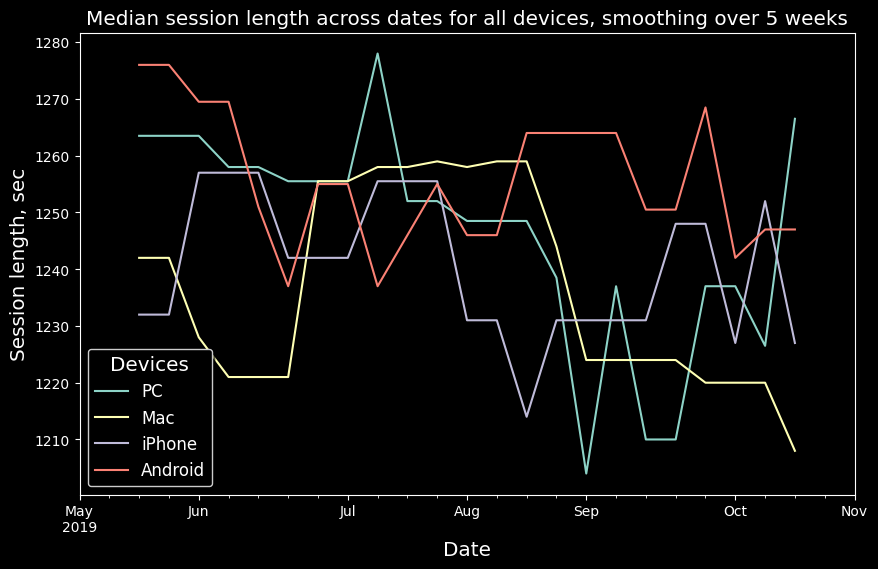

In [95]:
# set the size of the smoothing window
window=5

# apply smoothing window to each device type
visits_grouped_pc_smoothed = visits_grouped_pc.rolling(window=window, center=True).median()
visits_grouped_mac_smoothed = visits_grouped_mac.rolling(window=window, center=True).median()
visits_grouped_iphone_smoothed = visits_grouped_iphone.rolling(window=window, center=True).median()
visits_grouped_android_smoothed = visits_grouped_android.rolling(window=window, center=True).median()

df = pd.concat([visits_grouped_pc_smoothed, visits_grouped_mac_smoothed, visits_grouped_iphone_smoothed, visits_grouped_android_smoothed], axis=1)
df.columns = ['PC', 'Mac', 'iPhone', 'Android']

df.plot(kind='line', figsize=(10, 6))

plt.title('Median session length across dates for all devices, smoothing over 5 weeks', fontsize='x-large')
plt.xlabel('Date', fontsize='x-large')
plt.ylabel('Session length, sec', fontsize='x-large')
plt.legend(title='Devices', fontsize='large', title_fontsize='x-large', fancybox=True, shadow=True)
plt.show()

We checked the median values of session lengths on different devices, broken down by weeks, and applied smoothing for clarity. Perhaps there is seasonality, but the data does not seem to differ much from month to month.

## Let's estimate the payback of advertising

Using LTV, ROI and CAC charts, let's analyze the payback of advertising. Let's assume that November 1, 2019 is on the calendar, and the business plan stipulates that users should pay off no later than two weeks after attracting. Let's analyze with and without organic users.

- Let's analyze the payback of advertising using LTV and ROI graphs, as well as graphs of LTV, CAC and ROI dynamics.
- We will check the conversion of users and the dynamics of its change, as well as user retention.
- Let's analyze the payback of advertising by device.
- Let's analyze the payback of advertising by country.
- Let's analyze the payback of advertising with a breakdown by advertising channels.


- Main questions in this analysis section:
     - Does advertising aimed at attracting users in general pay off?
     - What devices, countries and advertising channels can have a negative impact on advertising ROI?
     - What can cause payback problems?

In [96]:
observation_date = datetime(2019, 11, 1).date() # moment of analysis
horizon_days = 14 # analysis horizon

In [97]:
# calculate LTV and ROI
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
    profiles, orders, observation_date, horizon_days) 

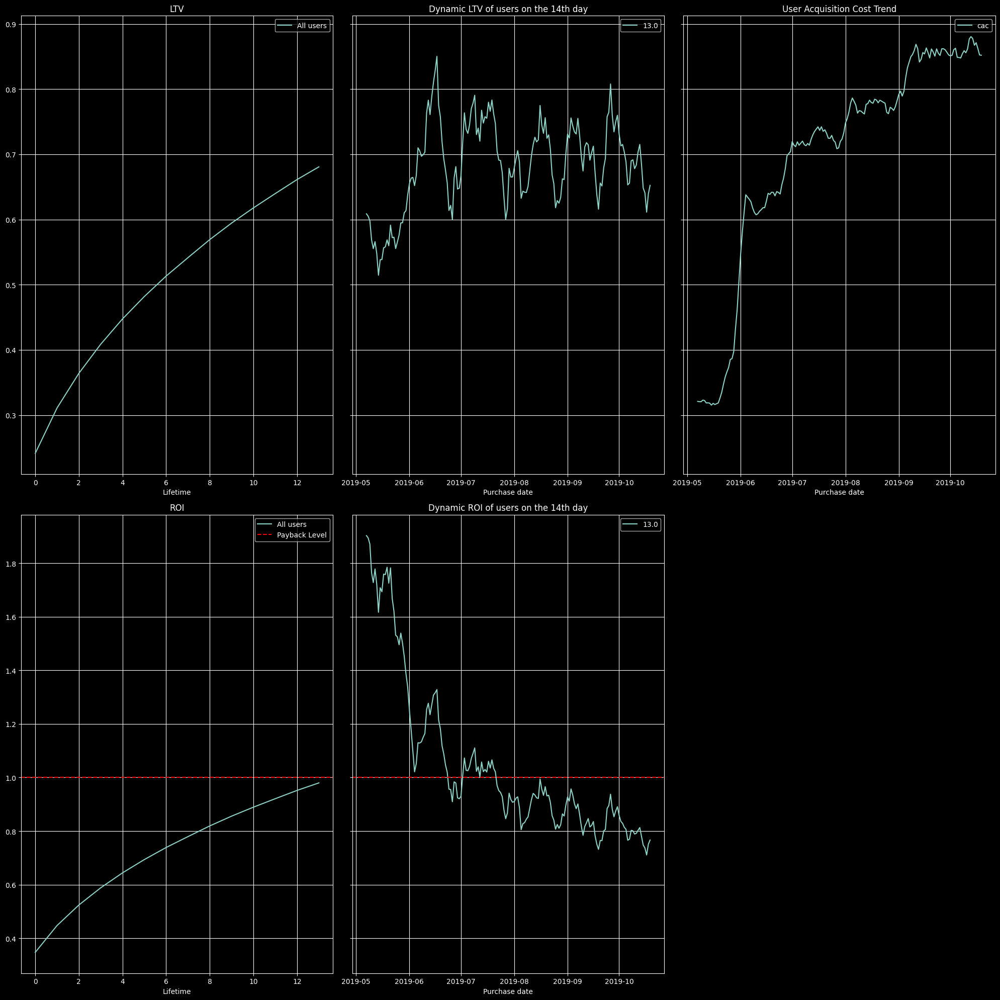

In [56]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days)

In [57]:
profiles.drop(index=profiles.loc[profiles['channel']=='organic'].index, inplace=True) #exclude organic users

In [98]:
# calculate LTV and ROI
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles, orders, observation_date, horizon_days)

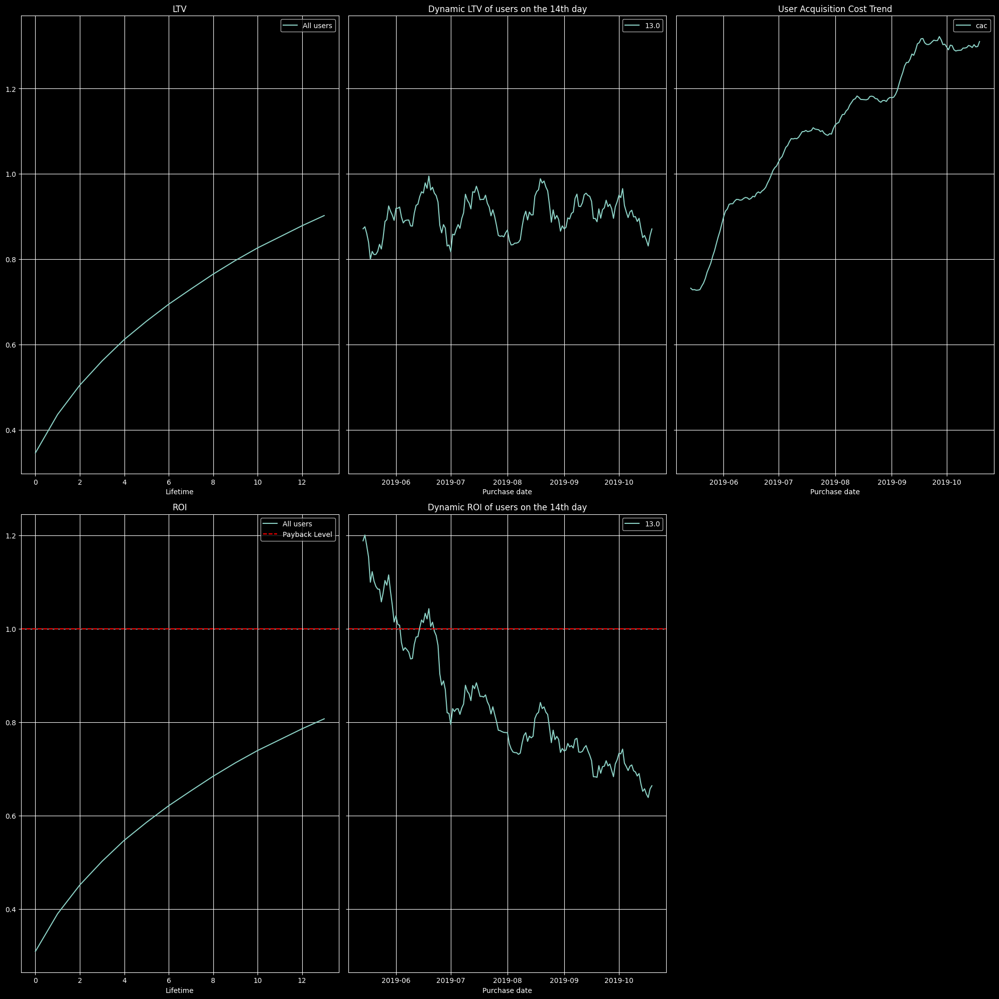

In [99]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

According to the graphs with and without organic users, we can draw the following conclusions:
- advertising does not pay off on the 14th day, ROI is only about 80%;
- CAC has a non-permanent upward trend, possibly due to a change in the advertising budget;
- the influence of the distribution of the advertising budget on channels with low conversion is obvious;
- Acquisition channels with high conversion and low cost of acquisition are underused and underfunded;
- some seasonality can be seen on the charts, which in turn could lead to a drawdown of the application in terms of rating after the holidays;
- LTV looks normal and raises no questions, LTV dynamics is also quite expected;
- from May to June 2019, the advertising campaign paid off, and then it only worsened its performance.


The general conclusion at this stage is the lack of funding for advertising in other channels and an overabundance of injections from channels with low efficiency.

In [60]:
# calculate conversion
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days)

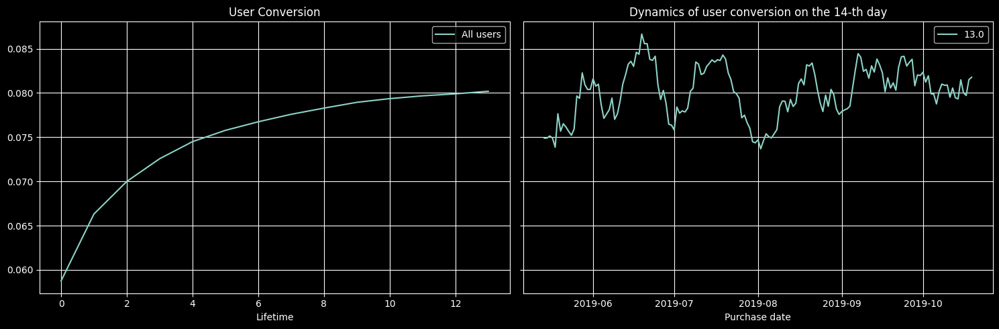

In [61]:
# build charts
plot_conversion(conversion_grouped, conversion_history, horizon_days, window=14) 

In [62]:
# calculate conversion by region segmentation
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=['region'])

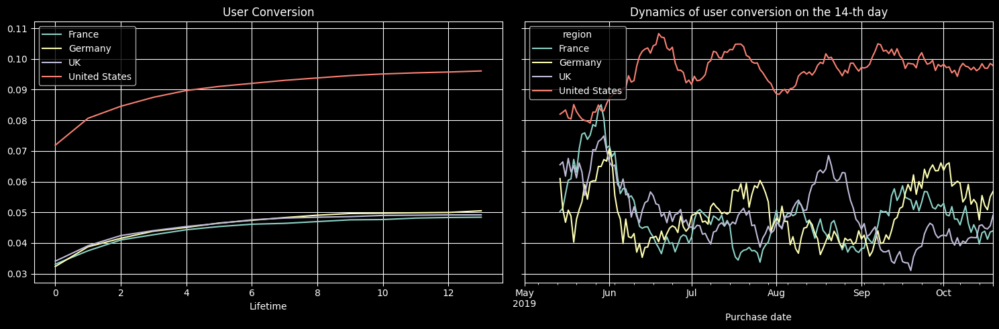

In [63]:
plot_conversion(conversion_grouped, conversion_history, horizon_days, window=14) 

In [64]:
# calculate conversion by channel segmentation
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=['channel'])

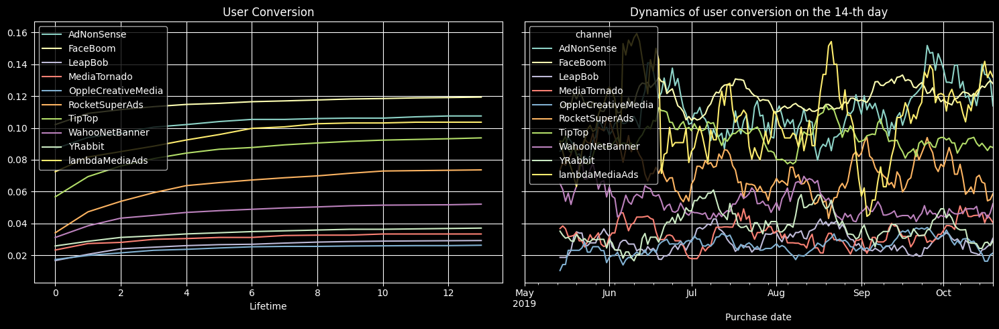

In [65]:
plot_conversion(conversion_grouped, conversion_history, horizon_days, window=14) 

In [66]:
# calculate conversion by device segmentation
conversion_raw, conversion_grouped, conversion_history = get_conversion(
    profiles, orders, observation_date, horizon_days, dimensions=['device'])

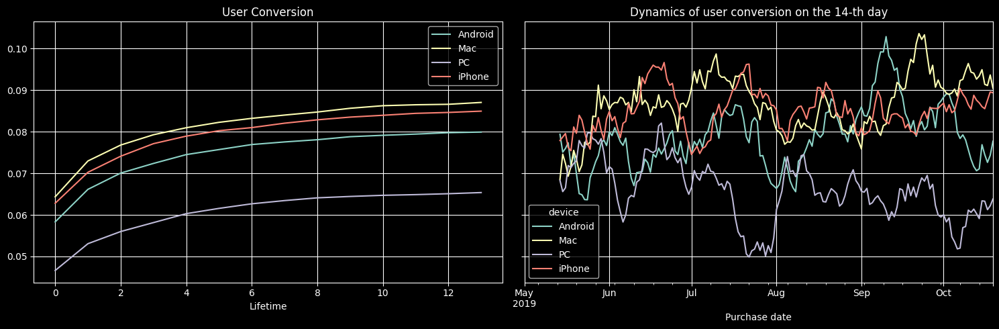

In [67]:
plot_conversion(conversion_grouped, conversion_history, horizon_days, window=14) 

User conversion looks weird. When calculating for all users, the conversion seems to be quite good. When viewed in terms of countries, it turns out that the convertibility of the US audience is an order of magnitude higher than all other territories. Among devices, the audience of PC users looks like an outsider - they convert the worst. On the charts of conversion dynamics, you can also see a seasonal decline in conversion for almost all platforms and territories around the beginning of each month. Separately, we note that the FaceBoom and Adnonsense channels are leaders in user conversion.

In [103]:
# calculate retention
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=[])

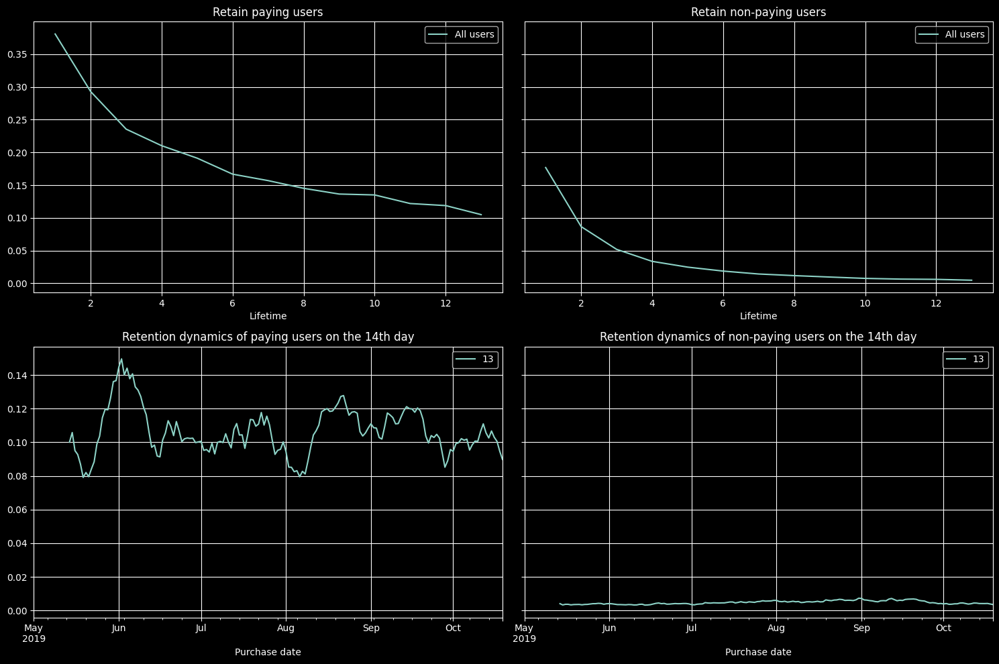

In [104]:
plot_retention(retention_grouped, retention_history, horizon_days, window=14) 

In [105]:
# calculate retention by region segmentation
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=['region'])

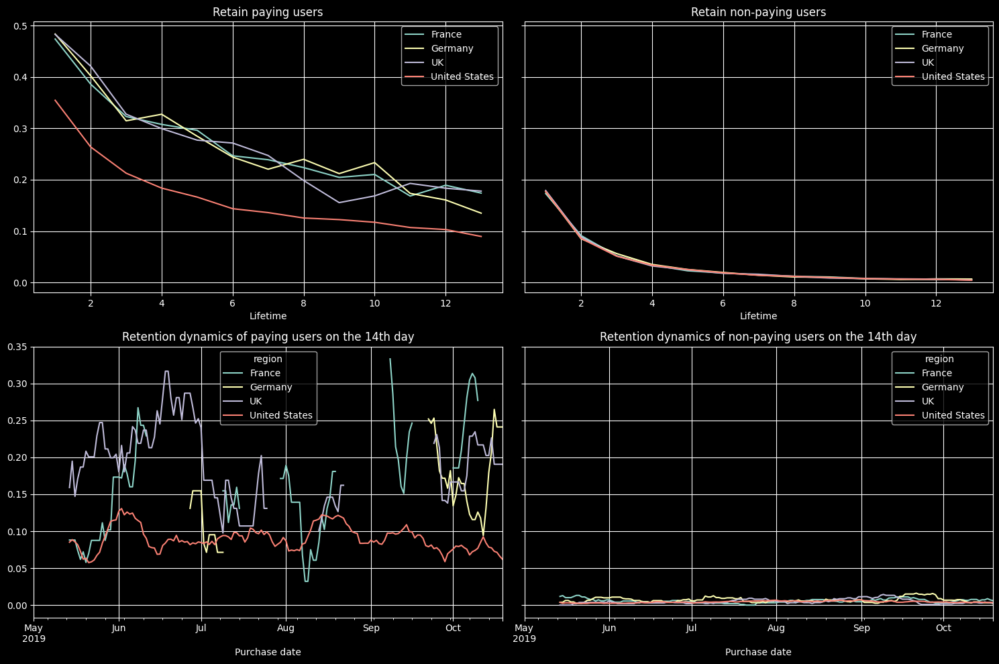

In [106]:
plot_retention(retention_grouped, retention_history, horizon_days, window=14) 

In [107]:
# calculate retention by channel segmentation
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=['channel'])

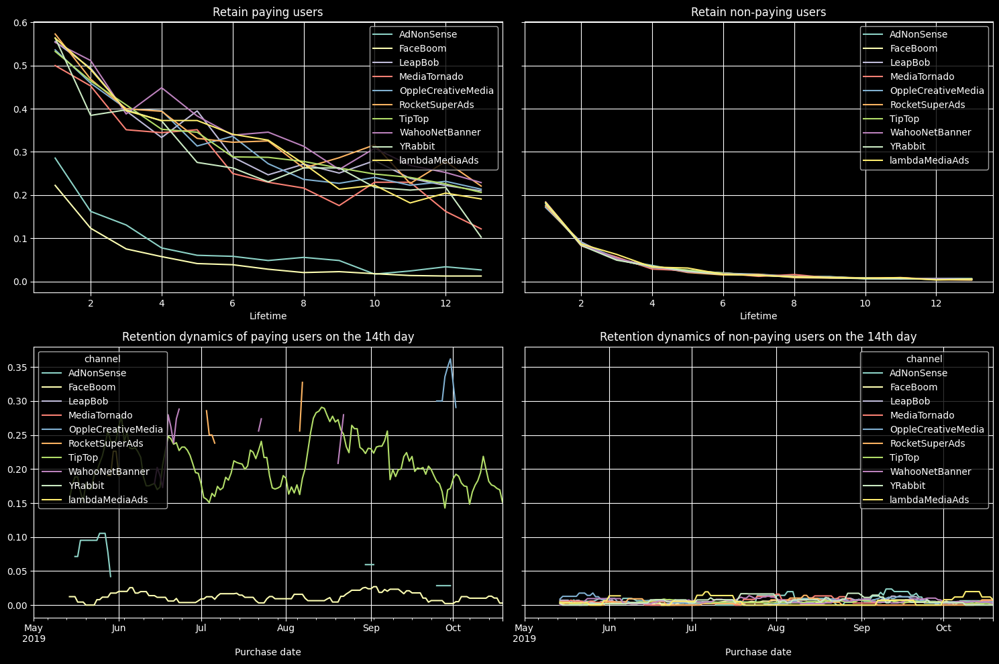

In [108]:
plot_retention(retention_grouped, retention_history, horizon_days, window=14) 

In [109]:
# calculate retention by device segmentation
retention_raw, retention_grouped, retention_history = get_retention(
    profiles, visits, observation_date, horizon_days, dimensions=['device'])

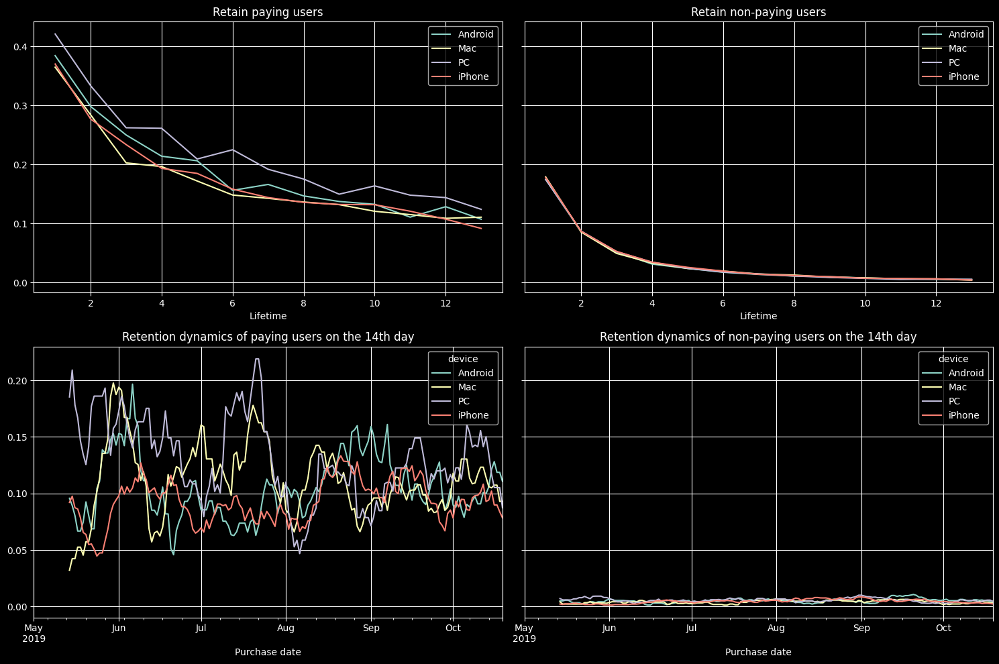

In [110]:
plot_retention(retention_grouped, retention_history, horizon_days, window=14) 

Based on retention charts, US users have the worst app retention, regardless of the device they use. FaceBoom and Adnonsense have the lowest user retention rates. But all other channels show approximately the same and at the same time more positive results.

In [111]:
# calculate LTV and ROI by device
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device'],
     ignore_horizon=False)

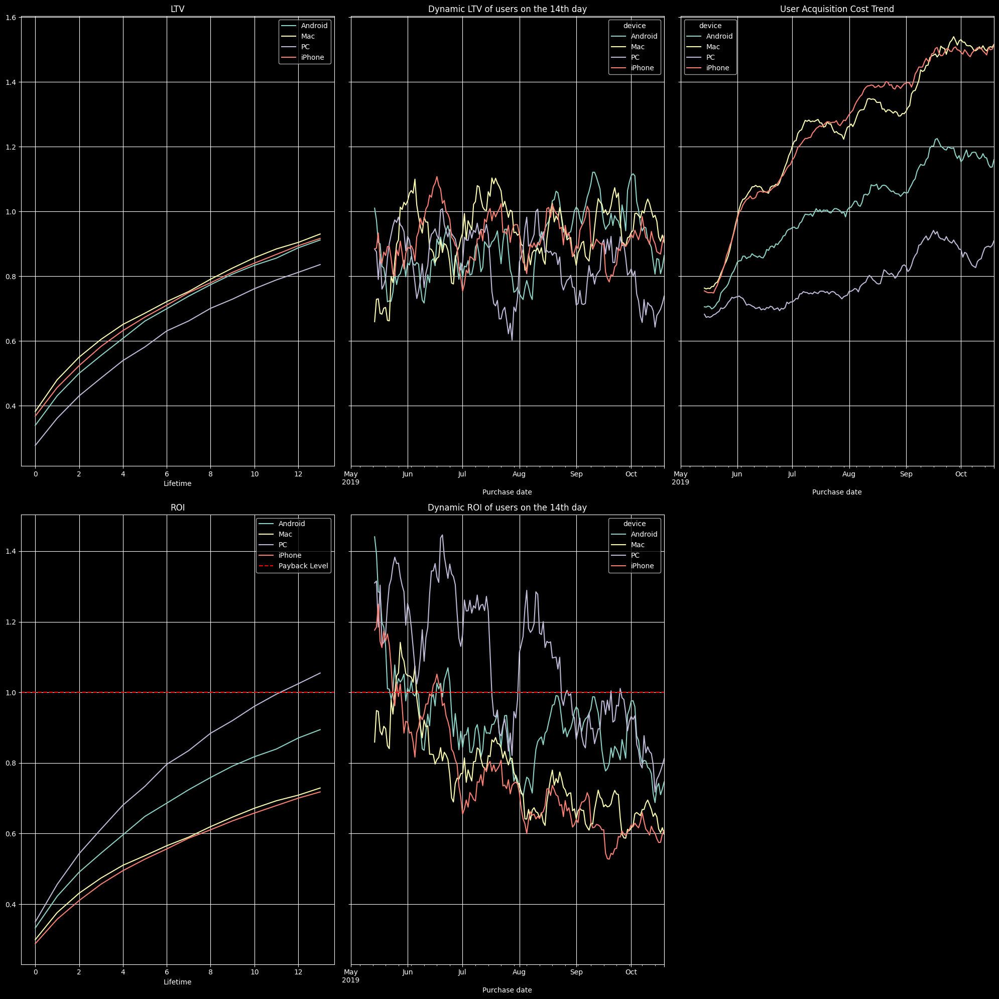

In [112]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

Advertising does not pay off on all devices throughout the entire analysis horizon. Only PC users make 13 lifetime profits. Acquisition costs are also volatile and cost the most to APPLE users. However, LTV is growing steadily across all devices. LTV in dynamics looks seasonal and more or less stable.

In [114]:
# calculate LTV and ROI by country
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles,
     orders,
     observation_date,
     horizon_days,
     dimensions=['region'],
     ignore_horizon=False)

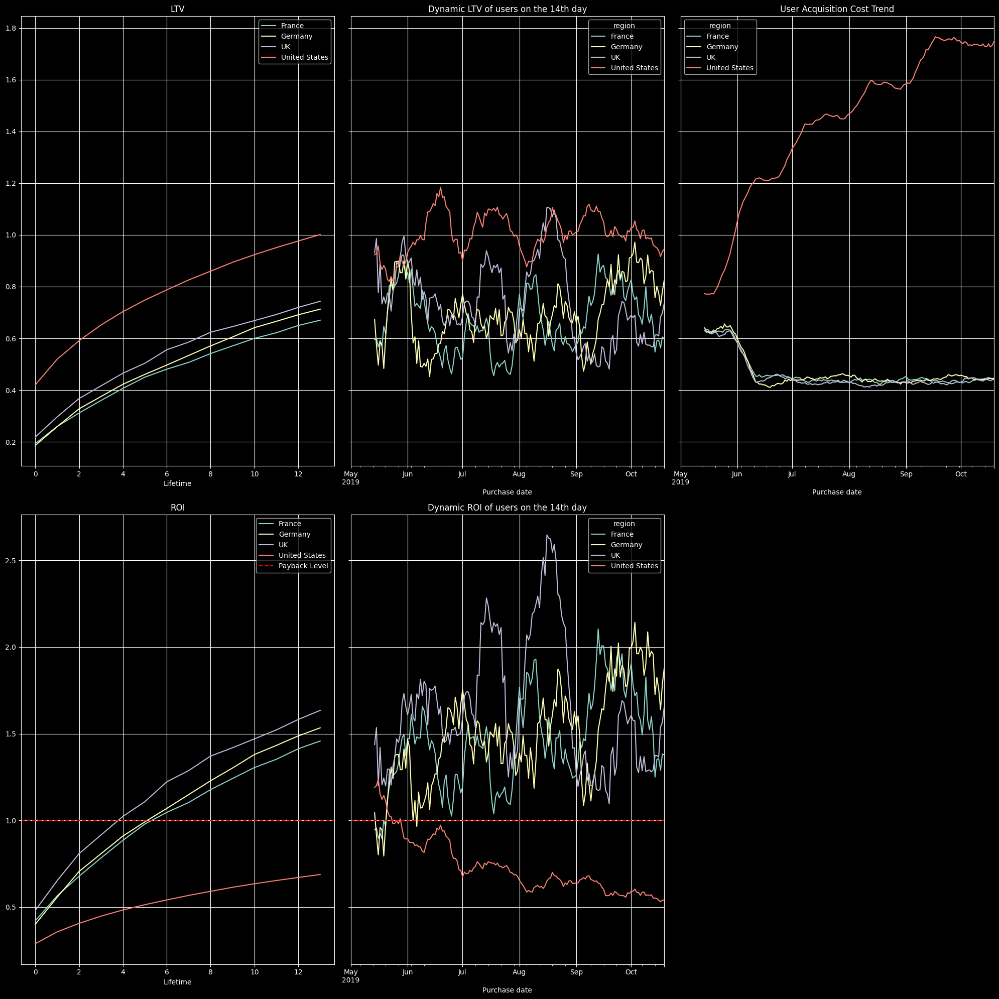

In [115]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

The US has a low payback, high LTV, high CAC, while other countries are quite successful in paying off. The rest of the users, having a lower LTV, bring the company profit starting from the 6th lifetime. Also, the cost of attracting users everywhere except the US is low and more or less stable.

In [117]:
# calculate LTV and ROI by channel
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles,
     orders,
     observation_date,
     horizon_days,
     dimensions=['channel'],
     ignore_horizon=False)

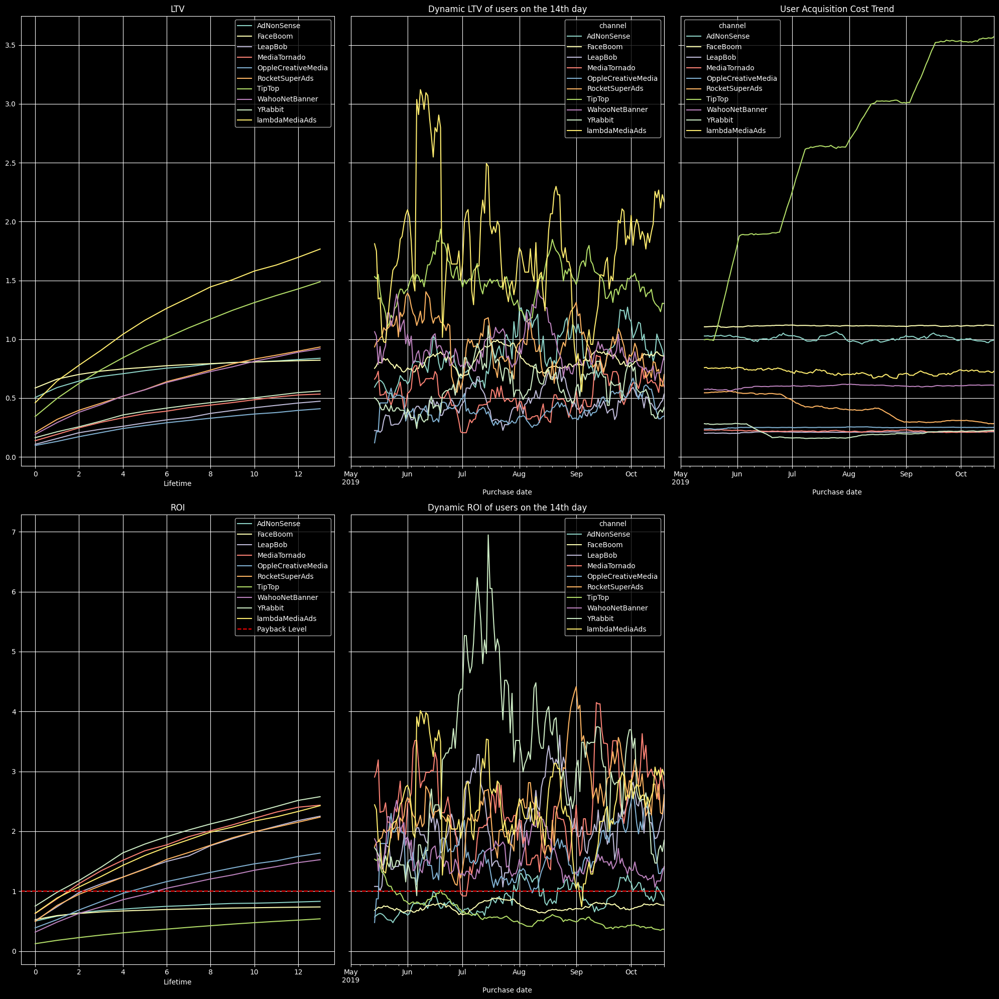

In [118]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [120]:
# calculate LTV and ROI by device and country
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device', 'region'],
     ignore_horizon=False)

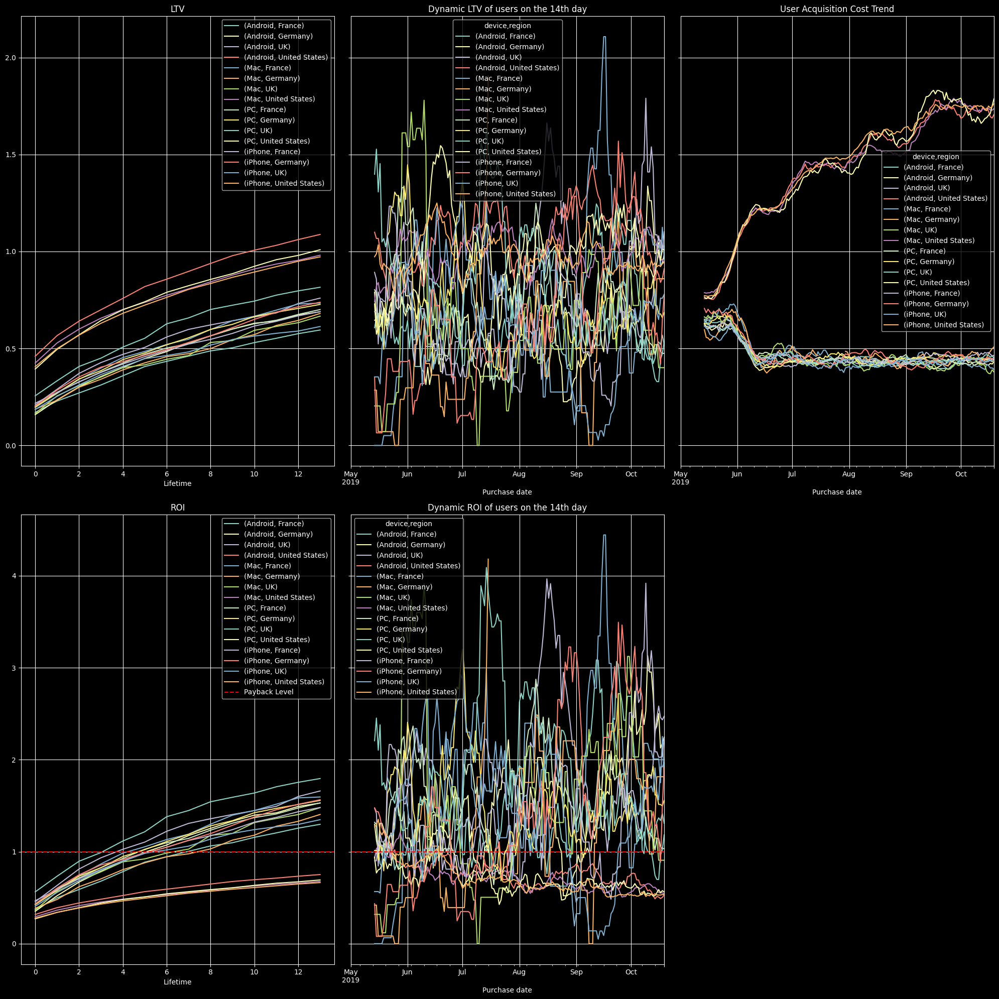

In [121]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [123]:
# filter the rows to leave only US data
profiles_usa = profiles.loc[profiles['region'] == 'United States']

# calculate LTV and ROI by device for USA only
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_usa,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device'],
     ignore_horizon=False)

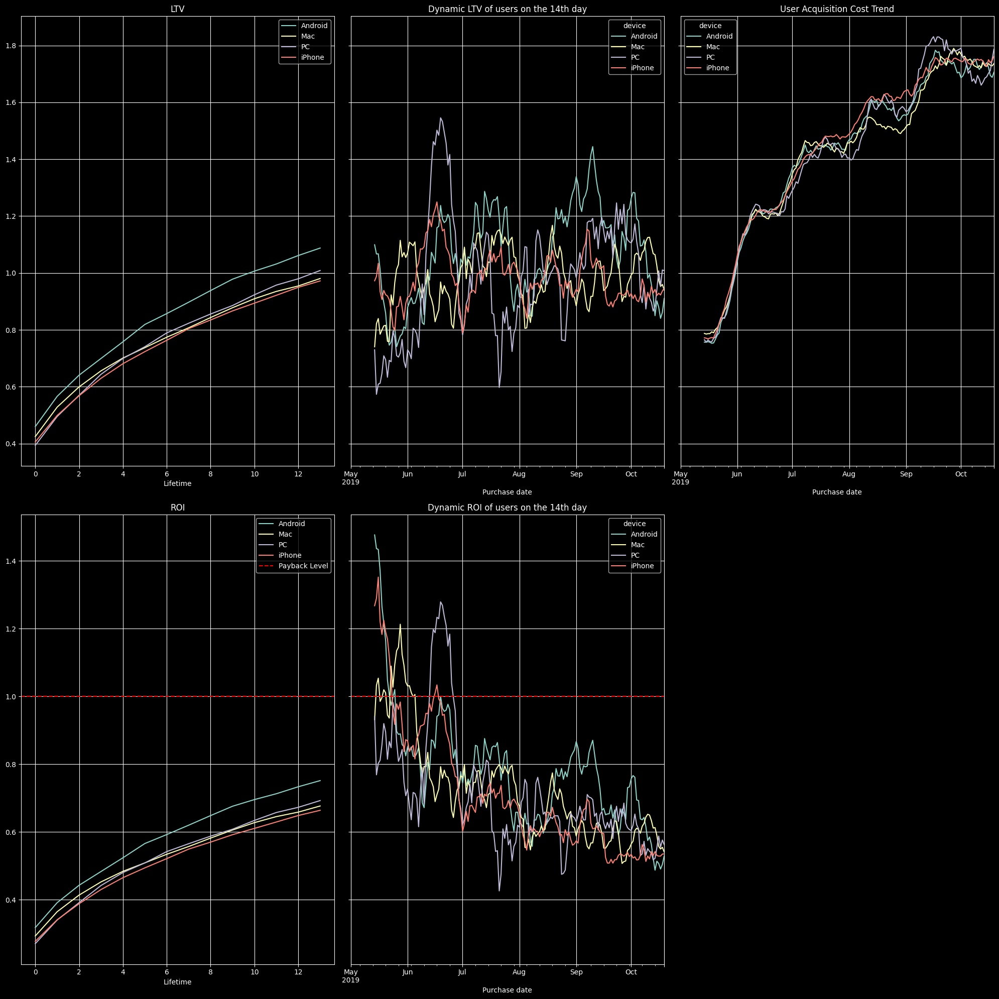

In [124]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [126]:
# calculate LTV and ROI by channel for USA only
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_usa,
     orders,
     observation_date,
     horizon_days,
     dimensions=['channel'],
     ignore_horizon=False)

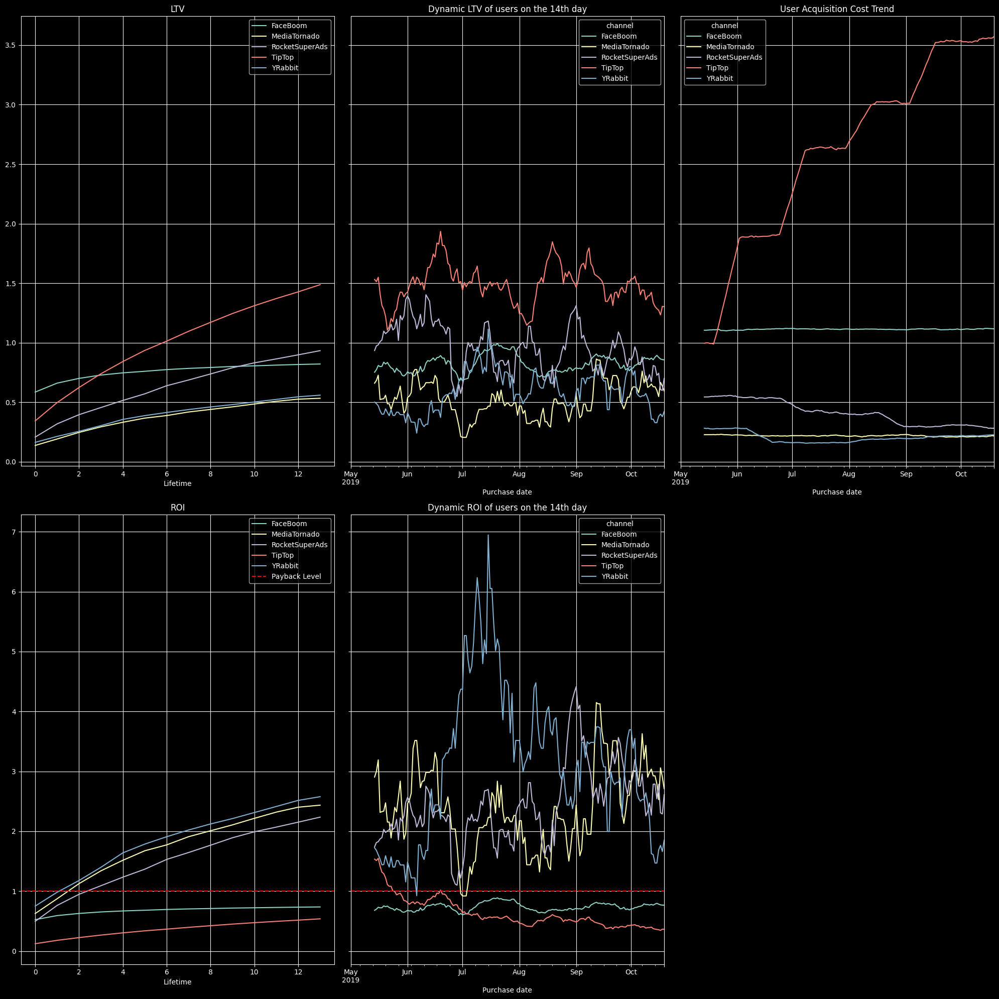

In [127]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In the US, an advertising campaign on all devices does not pay off.
Advertising through TipTop and FaceBoom channels does not pay off. The rest of the channels (MediaTornado, Rocket, Yrabbit) are profitable starting from the 2nd lifetime and have a low and more or less stable CAC.

In [132]:
# filter rows to leave only data for UK
profiles_uk = profiles.loc[profiles['region'] == 'UK']

# Calculate LTV and ROI by device for UK only
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_uk,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device'],
     ignore_horizon=False)

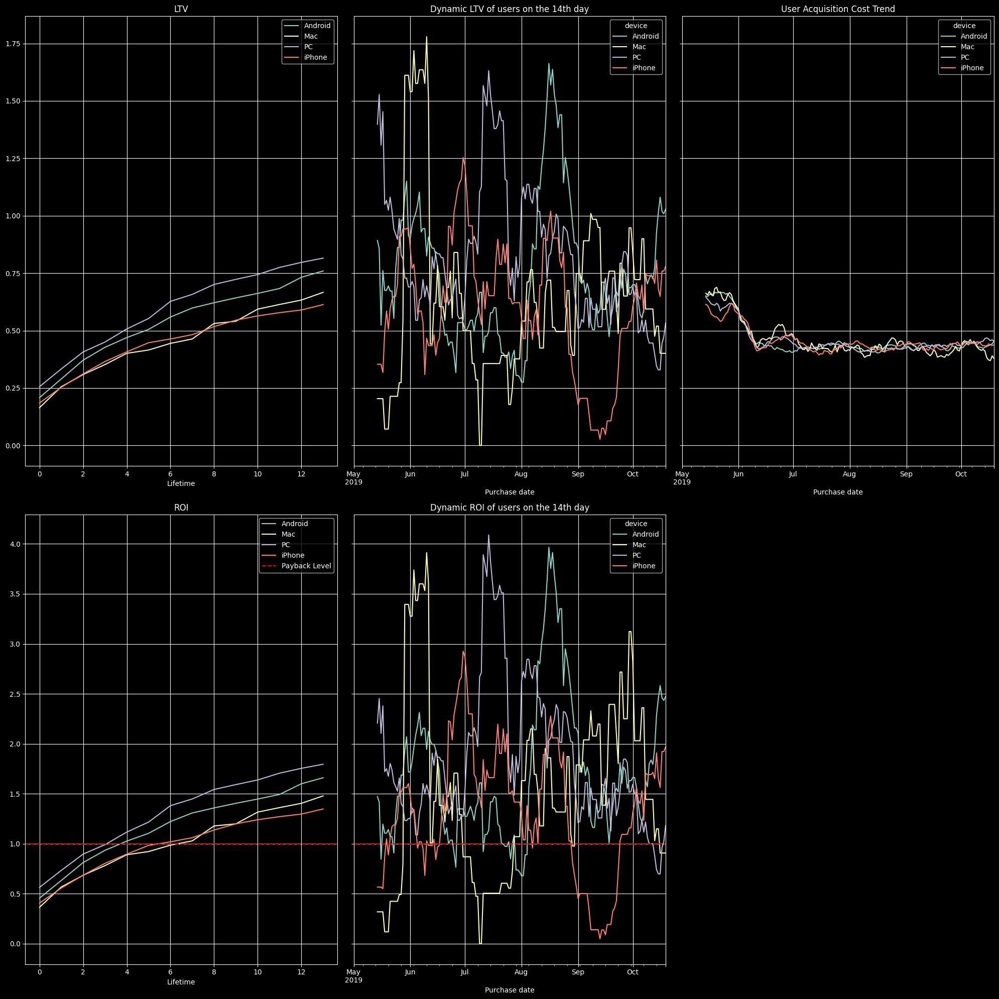

In [133]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [136]:
# Calculate LTV and ROI by device for UK only
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_uk,
     orders,
     observation_date,
     horizon_days,
     dimensions=['channel'],
     ignore_horizon=False)

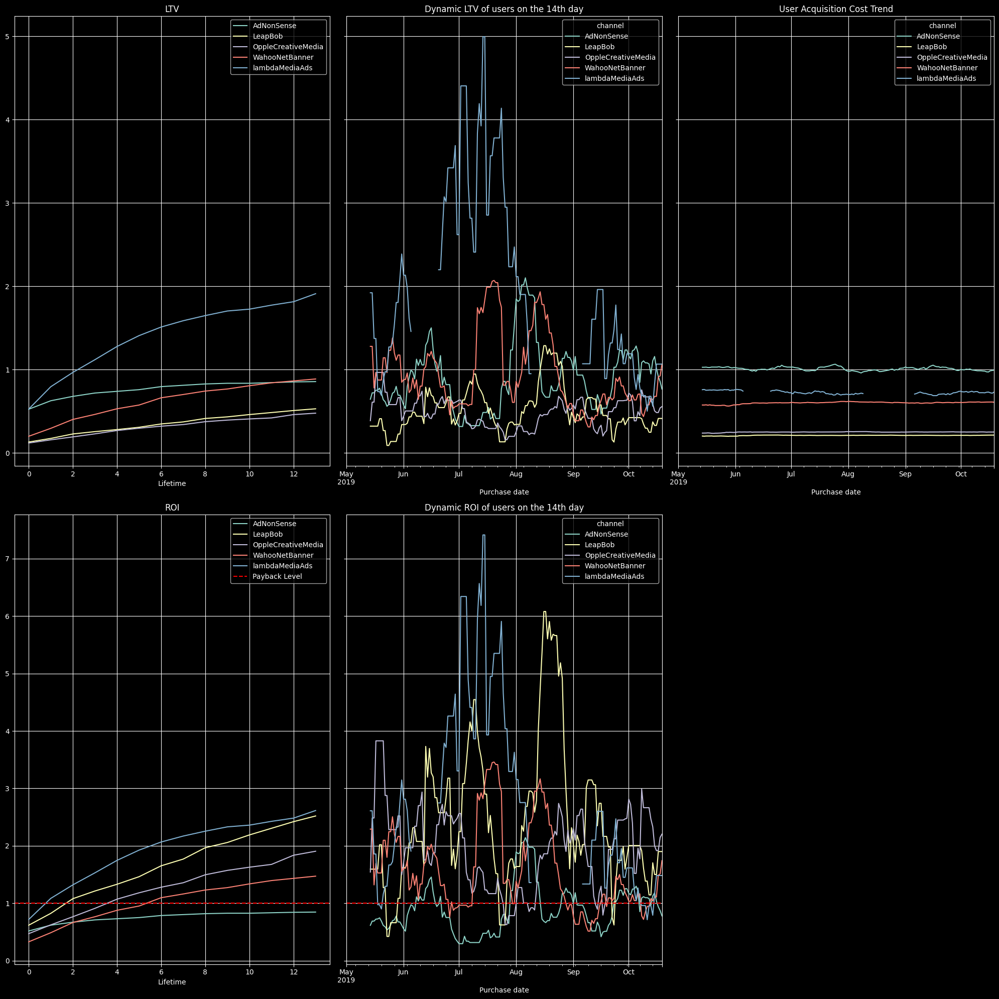

In [137]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In England, all devices pay off by the 6th lifetime, but the AdNonsense channel does not make a profit even by the 13th lifetime.

In [139]:
# filter the rows to leave only data for France
profiles_fr = profiles.loc[profiles['region'] == 'France']

# calculate LTV and ROI by device only for France
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_fr,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device'],
     ignore_horizon=False)

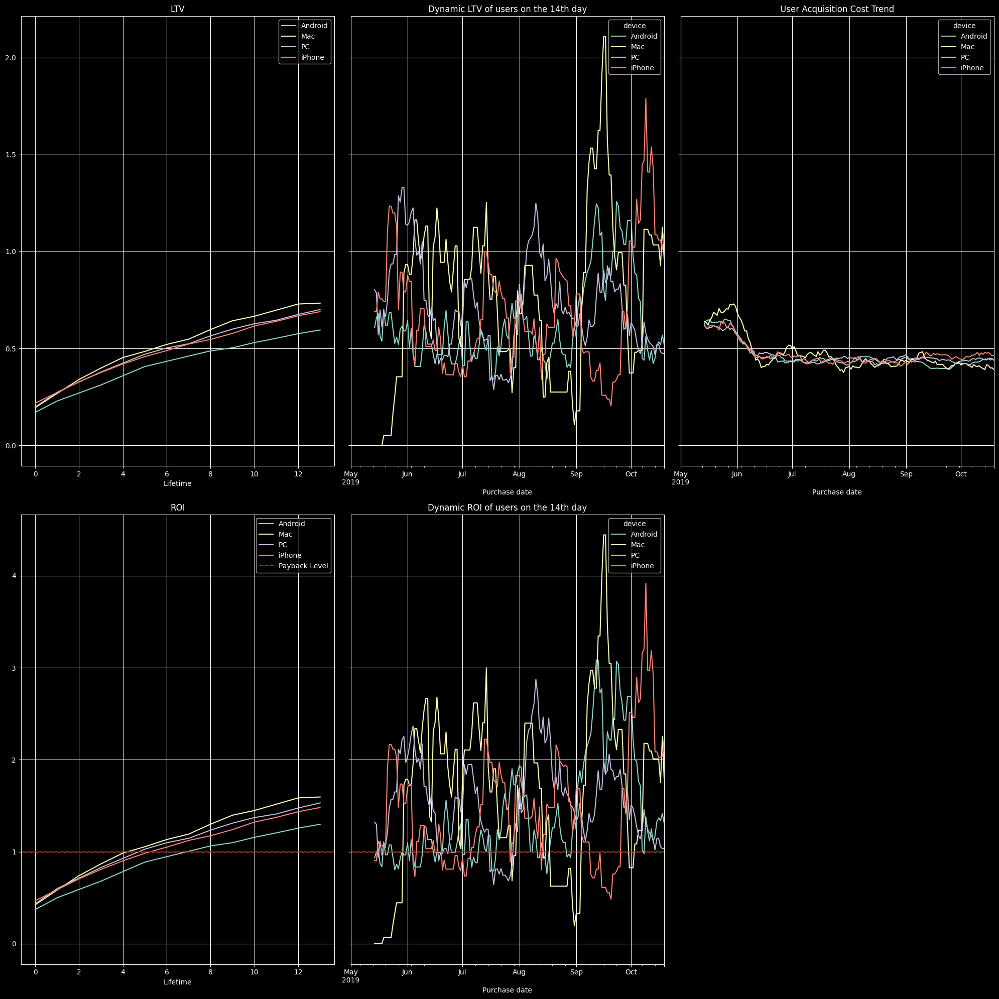

In [140]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [142]:
# calculate LTV and ROI by device only for France
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_fr,
     orders,
     observation_date,
     horizon_days,
     dimensions=['channel'],
     ignore_horizon=False)

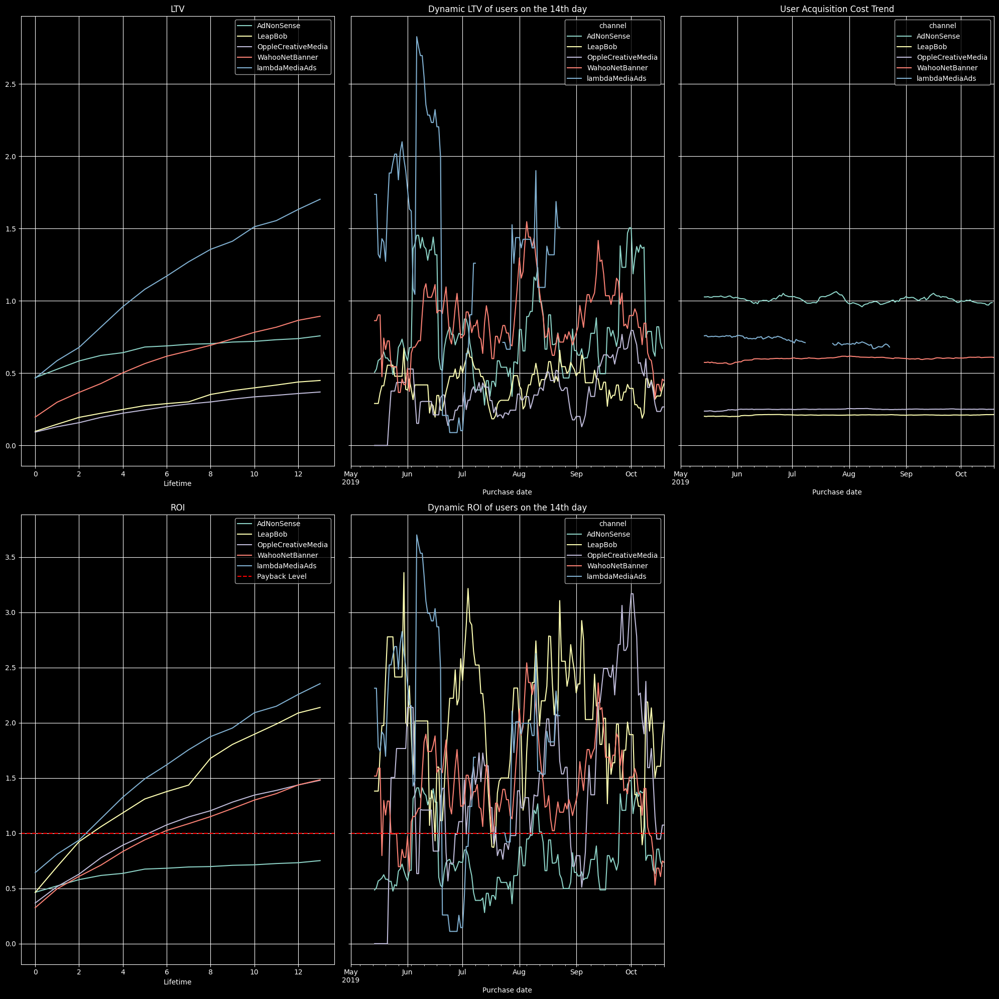

In [143]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

All devices pay off for 6-7 lifetime in France. The Adnonsense channel also does not generate profit over the entire analysis horizon.

In [145]:
# filter the rows to leave only data for Germany
profiles_gr = profiles.loc[profiles['region'] == 'Germany']

# calculate LTV and ROI by device only for Germany
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_gr,
     orders,
     observation_date,
     horizon_days,
     dimensions=['device'],
     ignore_horizon=False)

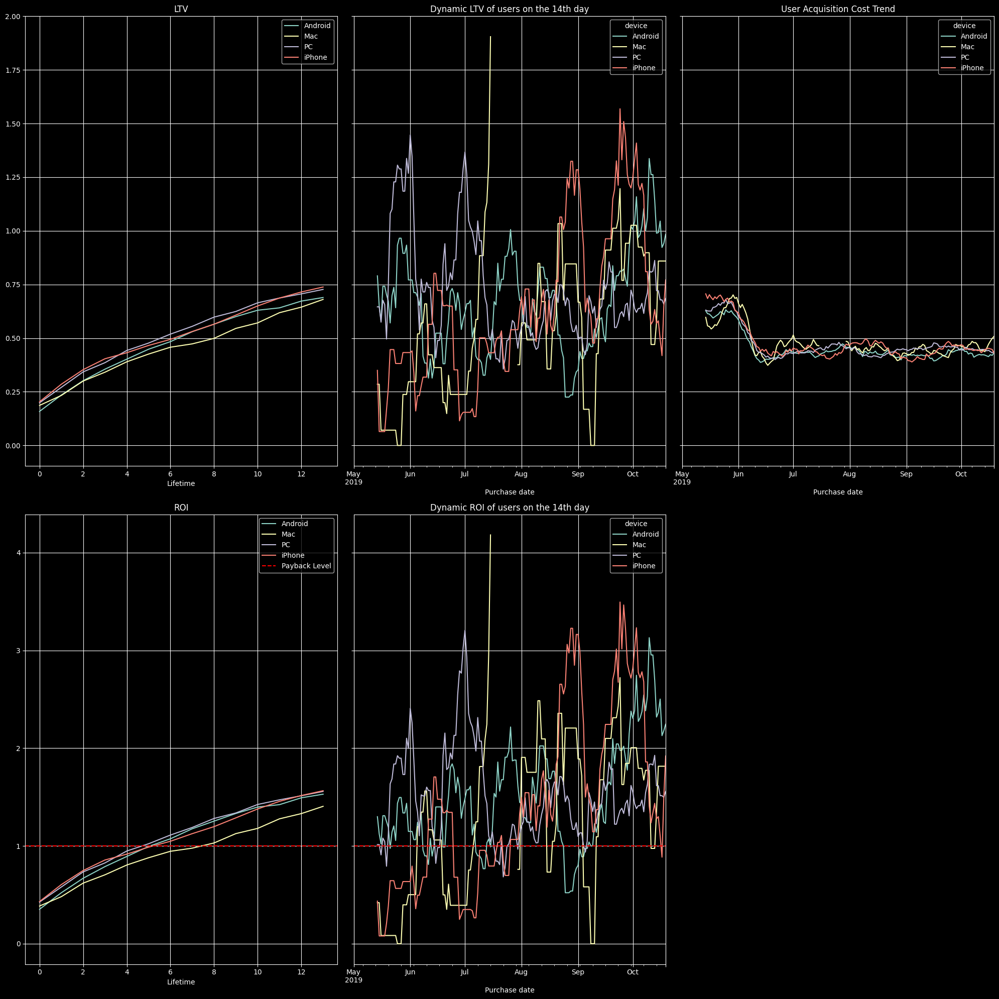

In [146]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

In [148]:
# calculate LTV and ROI by device only for France
ltv_raw, ltv_grouped, ltv_history, roi_grouped, roi_history = get_ltv(
     profiles_gr,
     orders,
     observation_date,
     horizon_days,
     dimensions=['channel'],
     ignore_horizon=False)

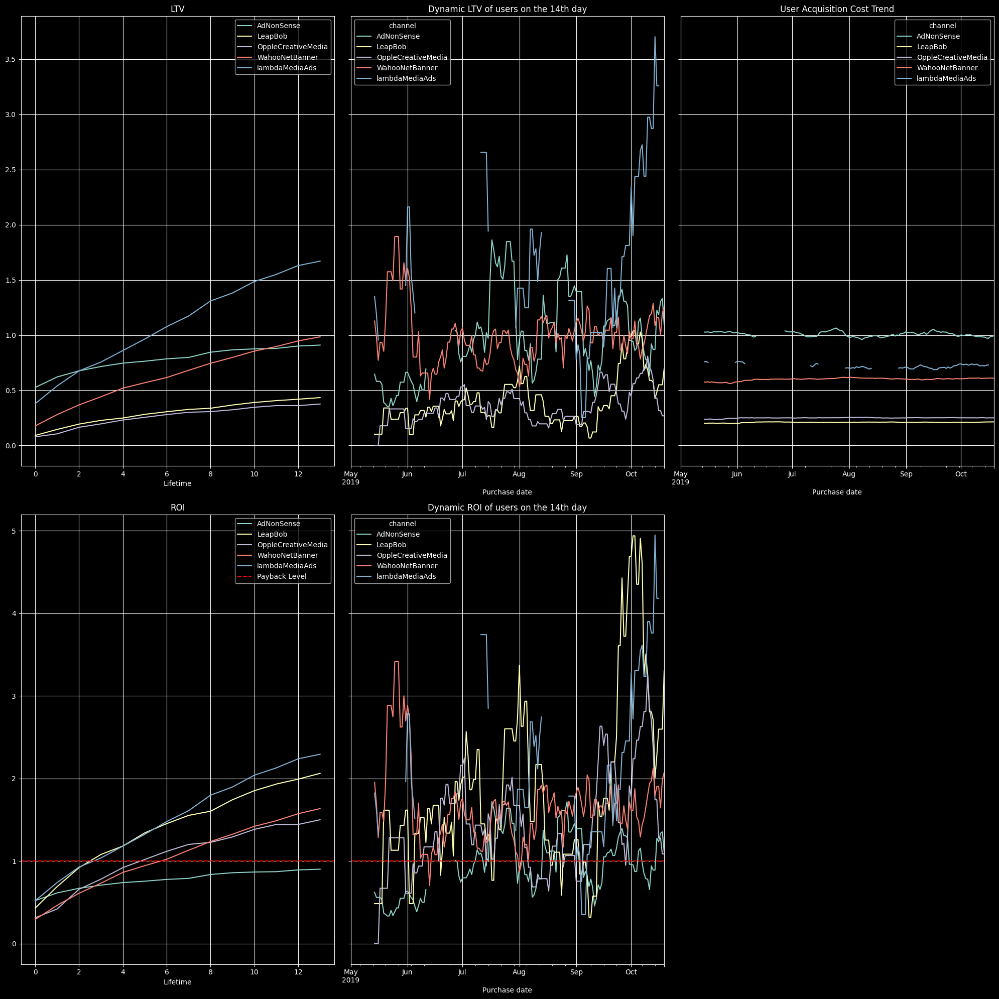

In [149]:
# build charts
plot_ltv_roi(ltv_grouped, ltv_history, roi_grouped, roi_history, horizon_days, window=14)

All devices in Germany pay off in the region of 6 lifetime. Just like in all of Europe, the AdNonsense channel does not make a profit. When broken down by country-channels and acquisition-device channels, it is noticeable that Lambda and TipTop have the highest LTV. At the same time, the channels to attract Tip-Top and FaceBoom in the USA do not pay off at all. The Adnonsens channel is not paying off in all of Europe. At the same time, TipTop has the highest CAC and is constantly growing in costs.

In general, advertising does not pay off, but there are segments of the audience that are profitable. The biggest problems are related to the US audience, as people from there are attracted the most and they pay the most in relation to all those who pay. However, the cost of attracting these users is the highest, so advertising campaigns do not pay off by device. In the US, most of the money goes to TipTop and FaceBoom channels, which do not fully pay off. MediaTornado, Rocket, Yrabbit are channels that spend very little money but pay off in the US. Doesn't make a profit in Europe, according to the Adnonsens charts. Also in this case, the company uses "fashionable" acquisition channels, concentrating its advertising budget on them and does not pay due attention to other acquisition channels with a sufficiently low CAC and high conversion. Based on the analysis done, it can be seen that with such a distribution of the advertising budget, all devices do not pay off, and there is a profit in countries everywhere except the United States.

## General conclusions on the project

The main reasons for the inefficiency of attracting a user, in our opinion, are the uneven distribution of the advertising budget between the channels of attraction, the non-optimal choice of such channels and regions from which users are attracted.

Lambda and TipTop channels have the highest LTV, while TipTop has the highest CAC. Thus, it takes 52% of the advertising budget and does not pay off in the US. At the same time, US users are the least loyal to the product, but they also pay the most. Also, the Adnonsens channel in all of Europe and FaceBoom in the US do not pay off. Users from the FaceBoom and lambdamediaAds channels cost about the same and are half the price of TipTop.


It is recommended not to consider AdNonsense as an acquisition channel at all, as it does not pay off at all.

Instead, it is proposed to reduce the advertising budget of TipTop and FaceBoom, and direct the freed up resources to channels with low CAC and high conversion.

For the USA it will be MediaTornado, Rocket, Yrabbit. Also in the US, traffic to Apple converts better than to other platforms, it is recommended to pay more attention to such devices.


For the European region, payback channels: Leapbob, Opplecreative, Superads, WahooNet. It is worth increasing their funding and allocating a little more budget to Apple devices.


It is also important to pay attention to the study of the reasons for the same median user session length on all devices and in all weeks. This is clearly something wrong and requires additional data for analysis.


Here are some top tips for increasing conversion and retention rates:
- Improve the usability and performance of the application: the application should work without delays and crashes, be intuitive and user-friendly. This will help increase user satisfaction and retention.

- Offer users new and interesting features: Users want new and interesting features that are convenient and useful. This will help increase user satisfaction and increase their interest in the application.

- Improve content quality: App content must be interesting and relevant in order to attract and retain users. Measure user reactions to content and analyze data to better understand what they like and don't like. This will help make the application more attractive to users and increase its conversion.

